# Intermediate Machine Learning: Assignment 3

**Deadline**

Assignment 3 is due Wednesday, October 30 by 11:59pm. Late work will not be accepted as per the course policies (see the Syllabus and Course policies on Canvas).

Directly sharing answers is not okay, but discussing problems with the course staff or with other students is encouraged.

You should start early so that you have time to get help if you're stuck. The drop-in office hours schedule can be found on Canvas. You can also post questions or start discussions on Ed Discussion. The assignment may look long at first glance, but the problems are broken up into steps that should help you to make steady progress.

**Submission**

Submit your assignment as a pdf file on Gradescope, and as a notebook (.ipynb) on Canvas. You can access Gradescope through Canvas on the left-side of the class home page. The problems in each homework assignment are numbered. Note: When submitting on Gradescope, please select the correct pages of your pdf that correspond to each problem. This will allow graders to more easily find your complete solution to each problem.

To produce the .pdf, please do the following in order to preserve the cell structure of the notebook:

Go to "File" at the top-left of your Jupyter Notebook
Under "Download as", select "HTML (.html)"
After the .html has downloaded, open it and then select "File" and "Print" (note you will not actually be printing)
From the print window, select the option to save as a .pdf

**Topics**

 * Variational autoencoders
 * Undirected graphs
 * The graphical lasso

This assignment will also help to solidify your Python and Jupyter notebook skills.


## Problem 1: Face time (35 points)

In this problem, we will implement a "shoestring" version of [this amazing fake face generator](https://www.nytimes.com/interactive/2020/11/21/science/artificial-intelligence-fake-people-faces.html), using a variational autoencoder (VAE). Building a generator like the one featured in the article can take a tremendous amount of computational resources, time, and parameter tuning. In this problem we will build a basic version to illustrate the main concepts, and help you to become more famililar with VAEs.  Here is an outline of the process that we'll step you through:

### Problem outline:

* Load data
* Create face groups based on attributes
* Construct the VAE
* Define the loss function and train the VAE (Problem 1.1)
* Encode and reconstruct faces (Problem 1.2)
* Visualize the latent space (Problem 1.3)
* Morph between faces (Problem 1.4)
* Shift attributes of faces (Problem 1.5)
* Generate new faces (Problem 1.6)
* Analyze the effect of the scaling factor in the loss function (Problem 1.7, optional)

In the next cell we load the packages that we'll need. If you don't have one or more of these, you can install them with `!pip install <package_name>` in the cell, or outside the notebook
with `conda install -c conda-forge <package_name>`

In [2]:
!pip install imageio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 315.4/315.4 kB 9.0 MB/s eta 0:00:00


In [3]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import os
import glob
import pandas as pd
import random
import numpy as np
import imageio
from tqdm import tqdm
from PIL import Image
from sklearn.model_selection import train_test_split
from scipy.stats import norm
import tensorflow
tensorflow.compat.v1.disable_eager_execution()

### Loading the data

[Labeled Faces in the Wild](http://vis-www.cs.umass.edu/lfw/) (LFW) is a database of face photographs. The images are placed in the folder lfw-deepfunneled. lfw_attributes.txt is a document including a set of attributes associated for each image, such as 'Male', 'Smile', 'Bold', etc. All the features are numerical and large positive values indicate that the keywords well describe the photo; large negative values indicate that the keywords don't fit the photo.

For this problem, we will keep only the middle parts of the photos to avoid complex backgrounds.

Download the data from the cloud at these URLs:

https://sds365.s3.amazonaws.com/lfw/lfw-deepfunneled.zip
<br>
https://sds365.s3.amazonaws.com/lfw/lfw_attributes.txt

Once you have the data, unzip it, and place it in a directory that we will call "YOUR_PATH" below.
  
Run all the cells in this section to load the data.

Note: Please write down the entire path instead of using something like '~/Desktop/datasets/' to avoid unnecessary compiling errors. Also, if you choose to use Colab to do your homework. We need to download the data into the same directory as your code. You may also need

"from google.colab import drive"

"drive.mount('/content/drive')"

to enable using paths in Google Drive before starting your code below. But personally, I would suggest using jupyter notebook to run the code locally instead of using Google Colab since the latter may take longer time.

In [4]:
# Change these path names to correspond with your directory
DATASET_PATH ="/Users/ananya_krishna/Downloads/lfw-deepfunneled"
ATTRIBUTES_PATH = "/Users/ananya_krishna/Downloads/lfw_attributes.txt"

In [5]:
# Make sure the above path is correct before running this cell
dataset = []
for path in glob.iglob(os.path.join(DATASET_PATH, "**", "*.jpg")):
    person = path.split("/")[-2]
    dataset.append({"person":person, "path": path})

dataset = pd.DataFrame(dataset)
dataset = dataset.groupby("person").filter(lambda x: len(x) < 100 )
dataset.head(10)

,person,path
0,German_Khan,/Users/ananya_krishna/Downloads/lfw-deepfunnel...
1,Stefano_Gabbana,/Users/ananya_krishna/Downloads/lfw-deepfunnel...
2,Dragan_Covic,/Users/ananya_krishna/Downloads/lfw-deepfunnel...
3,Jeff_Hornacek,/Users/ananya_krishna/Downloads/lfw-deepfunnel...
4,Sureyya_Ayhan,/Users/ananya_krishna/Downloads/lfw-deepfunnel...
5,Deb_Santos,/Users/ananya_krishna/Downloads/lfw-deepfunnel...
6,Bob_Newhart,/Users/ananya_krishna/Downloads/lfw-deepfunnel...
7,Wang_Hailan,/Users/ananya_krishna/Downloads/lfw-deepfunnel...
8,Paul_McNulty,/Users/ananya_krishna/Downloads/lfw-deepfunnel...
9,Paul_McNulty,/Users/ananya_krishna/Downloads/lfw-deepfunnel...


The following cell will display some sample images

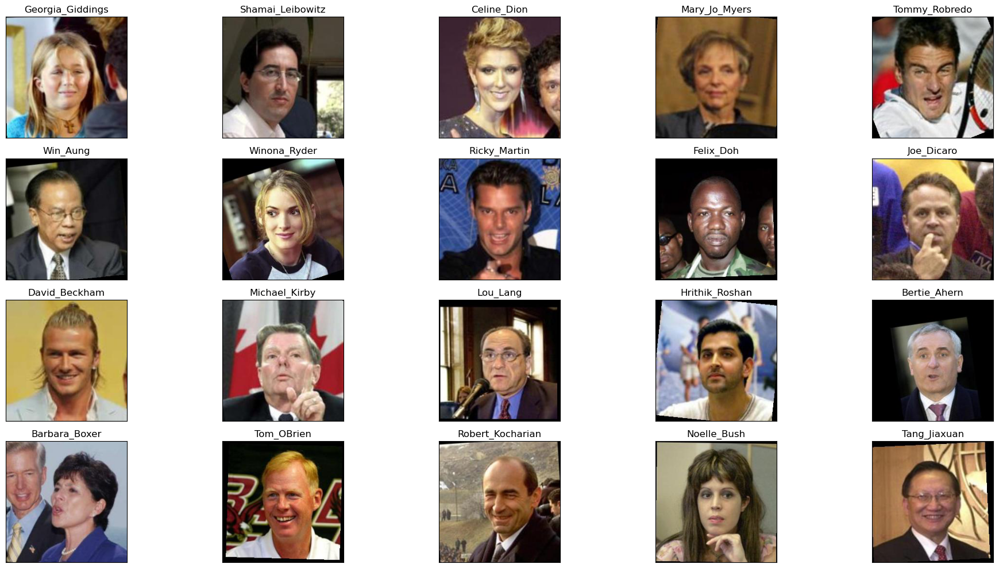

In [6]:
sampled_id = []

plt.figure(figsize=(20,10))
for i in range(20):
    idx = random.randint(0, len(dataset))
    img = plt.imread(dataset.path.iloc[idx])
    plt.subplot(4, 5, i+1)
    plt.imshow(img)
    plt.title(dataset.person.iloc[idx])
    plt.xticks([])
    plt.yticks([])
    sampled_id.append(idx)
plt.tight_layout()
plt.show()

The following cell shows the images with some of the background removed.

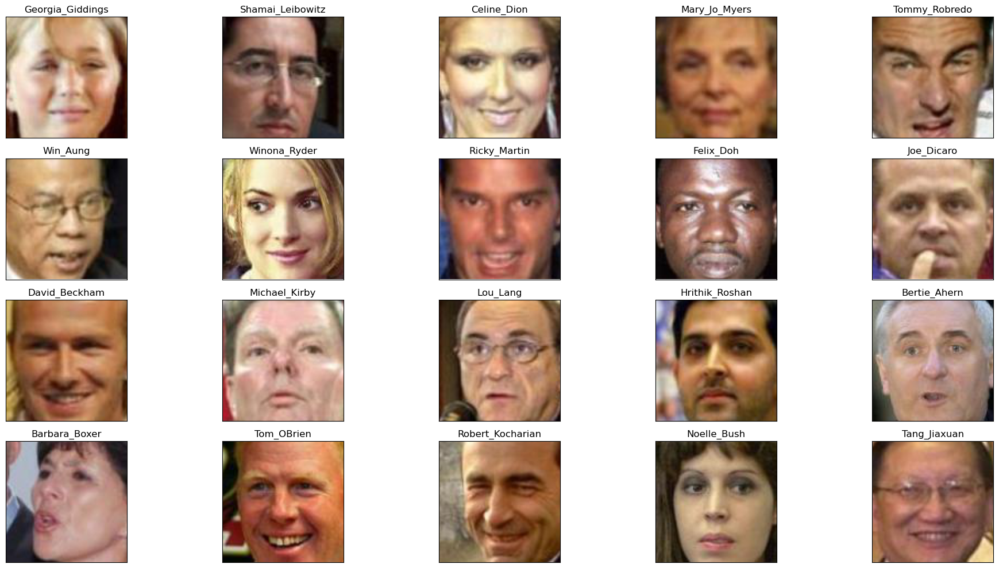

In [7]:
dx=70
dy=70

plt.figure(figsize=(20,10))
for i in range(20):
    idx = sampled_id[i]
    img = plt.imread(dataset.path.iloc[idx])
    plt.subplot(4, 5, i+1)
    plt.imshow(img[dy:-dy,dx:-dx])
    plt.title(dataset.person.iloc[idx])
    plt.xticks([])
    plt.yticks([])
plt.tight_layout()
plt.show()

The following function crops the images to 45x45 pixels, which is what we will use in this problem.

In [8]:
def fetch_dataset(dx=70, dy=70, dimx=45, dimy=45):

    df_attrs = pd.read_csv(ATTRIBUTES_PATH, sep='\t', skiprows=1,)
    df_attrs = pd.DataFrame(df_attrs.iloc[:,:-1].values, columns = df_attrs.columns[1:])

    photo_ids = []
    for dirpath, dirnames, filenames in os.walk(DATASET_PATH):
        for fname in filenames:
            if fname.endswith(".jpg"):
                fpath = os.path.join(dirpath,fname)
                photo_id = fname[:-4].replace('_',' ').split()
                person_id = ' '.join(photo_id[:-1])
                photo_number = int(photo_id[-1])
                photo_ids.append({'person':person_id,'imagenum':photo_number,'photo_path':fpath})

    photo_ids = pd.DataFrame(photo_ids)
    df = pd.merge(df_attrs,photo_ids,on=('person','imagenum'))

    assert len(df)==len(df_attrs),"lost some data when merging dataframes"

    all_photos = df['photo_path'].apply(imageio.imread)\
                                .apply(lambda img:img[dy:-dy,dx:-dx])\
                                .apply(lambda img: np.array(Image.fromarray(img).resize([dimx,dimy])) )

    all_photos = np.stack(all_photos.values).astype('uint8')
    all_attrs = df.drop(["photo_path","person","imagenum"],axis=1)

    return all_photos,all_attrs

The variable `data` has all the face images and the variable `attrs` has all the attributes. The 8-bit RGB values are converted to values between 0 and 1 for modeling and plotting purposes.

In [9]:
data, attrs = fetch_dataset()
data = np.array(data / 255, dtype='float32')

### Create Face Groups

We can now create groups of faces, by selecting the faces having the highest or lowest scores for each of the attributes. Run all the cells in this section to create and plot some face groups.

In [10]:
def plot_gallery(images, h, w, n_row=3, n_col=6, with_title=False, titles=[]):
    plt.figure(figsize=(1.75 * n_col, 2 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        try:
            plt.imshow(images[i].reshape((h, w, 3)), cmap=plt.cm.gray, vmin=-1, vmax=1, interpolation='nearest')
            if with_title:
                plt.title(titles[i])
            plt.xticks(())
            plt.yticks(())
        except:
            pass

In [11]:
IMAGE_H = data.shape[1]
IMAGE_W = data.shape[2]
N_CHANNELS = 3

In [55]:
smile_ids = attrs['Smiling'].sort_values(ascending=False).head(36).index.values
smile_data = data[smile_ids]

no_smile_ids = attrs['Smiling'].sort_values(ascending=True).head(36).index.values
no_smile_data = data[no_smile_ids]

eyeglasses_ids = attrs['Eyeglasses'].sort_values(ascending=False).head(36).index.values
eyeglasses_data = data[eyeglasses_ids]

sunglasses_ids = attrs['Sunglasses'].sort_values(ascending=False).head(36).index.values
sunglasses_data = data[sunglasses_ids]

mustache_ids = attrs['Mustache'].sort_values(ascending=False).head(36).index.values
mustache_data = data[mustache_ids]

male_ids = attrs['Male'].sort_values(ascending=False).head(36).index.values
male_data = data[male_ids]

female_ids = attrs['Male'].sort_values(ascending=True).head(36).index.values
female_data = data[female_ids]

eyeclosed_ids = attrs['Eyes Open'].sort_values(ascending=True).head(36).index.values
eyeclosed_data = data[eyeclosed_ids]

eyeopen_ids = attrs['Eyes Open'].sort_values(ascending=False).head(36).index.values
eyeopen_data = data[eyeopen_ids]

mouthopen_ids = attrs['Mouth Wide Open'].sort_values(ascending=False).head(36).index.values
mouthopen_data = data[mouthopen_ids]

makeup_ids = attrs['Heavy Makeup'].sort_values(ascending=False).head(36).index.values
makeup_data = data[makeup_ids]

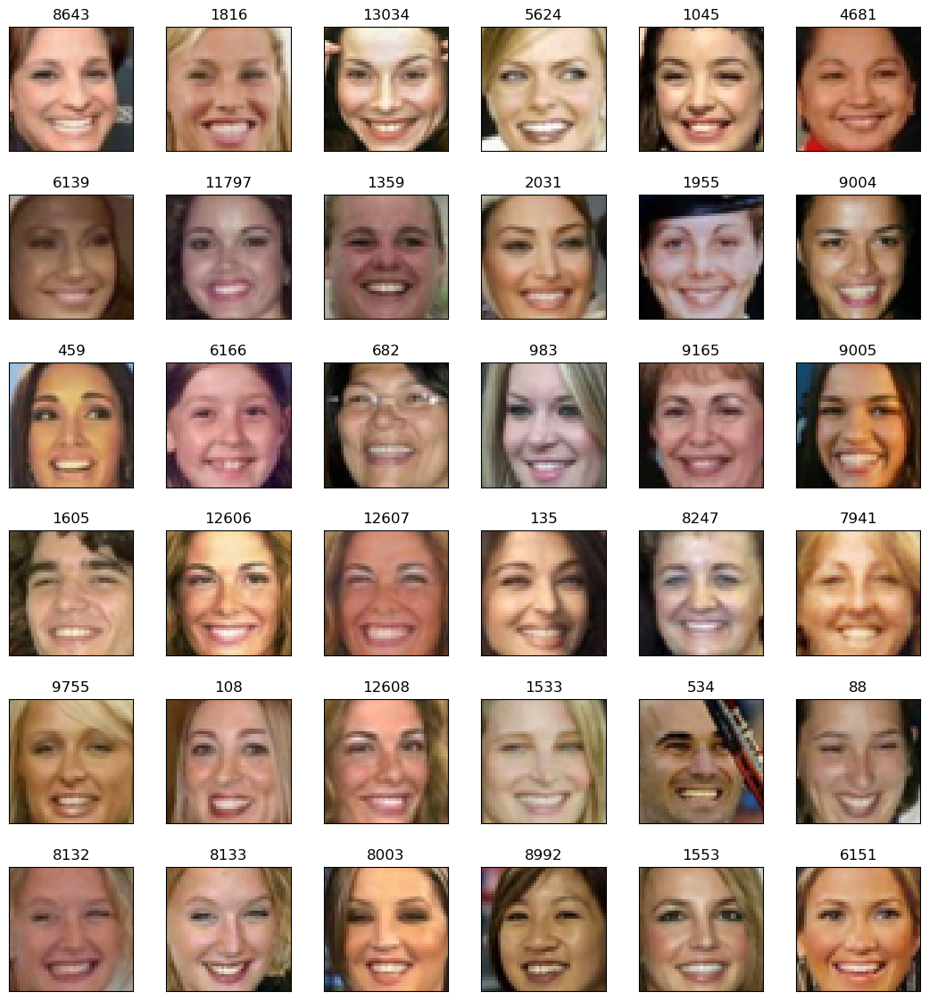

In [13]:
plot_gallery(smile_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=smile_ids)

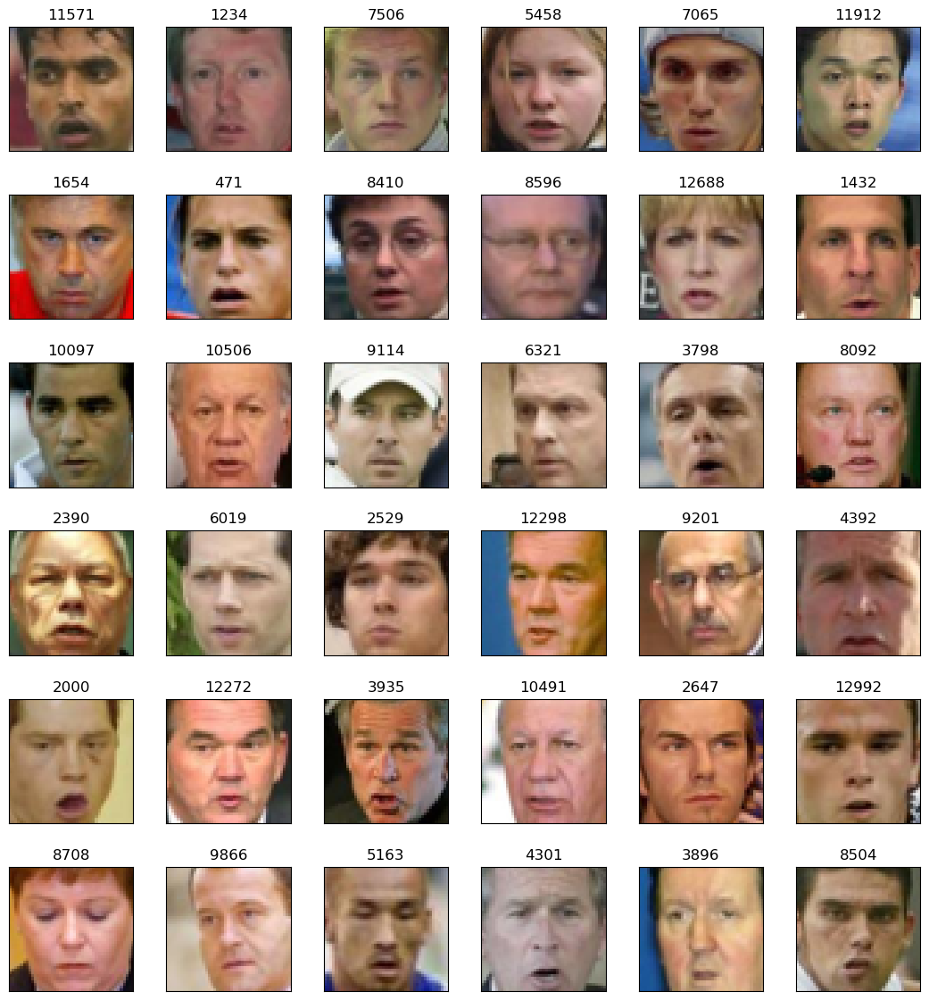

In [14]:
plot_gallery(no_smile_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=no_smile_ids)

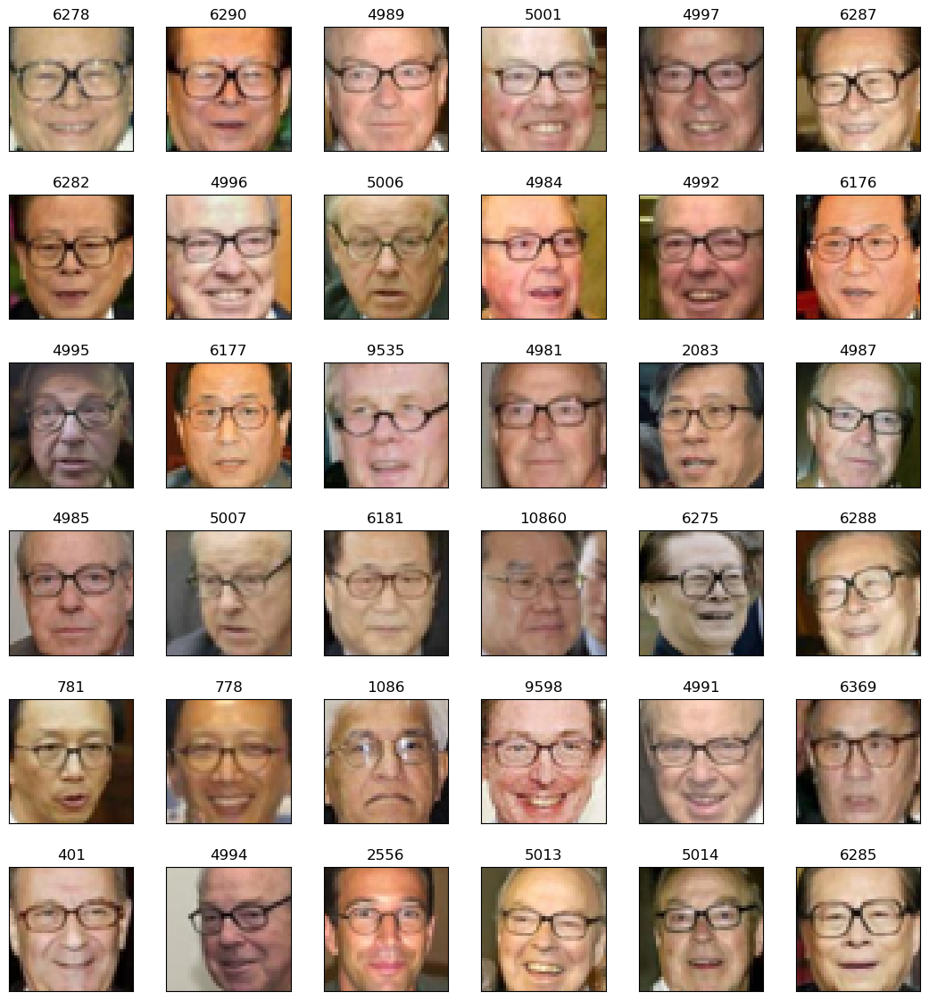

In [15]:
plot_gallery(eyeglasses_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=eyeglasses_ids)

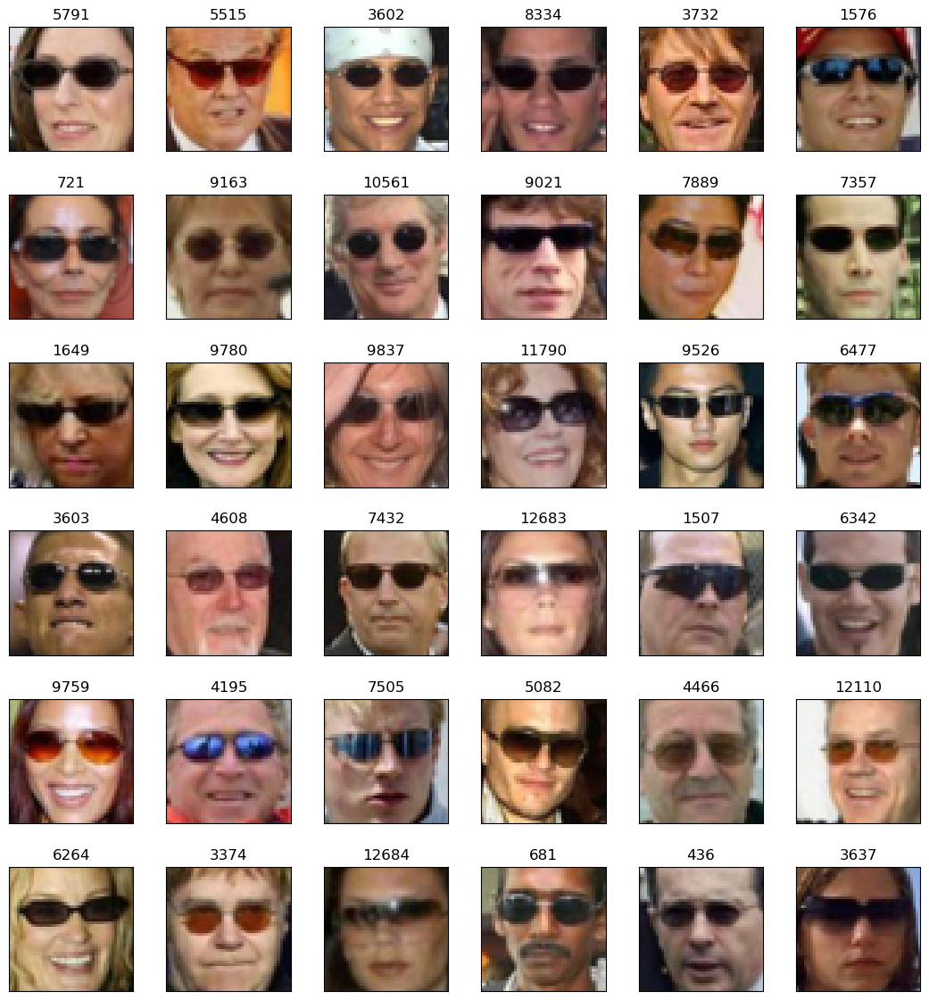

In [16]:
plot_gallery(sunglasses_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=sunglasses_ids)

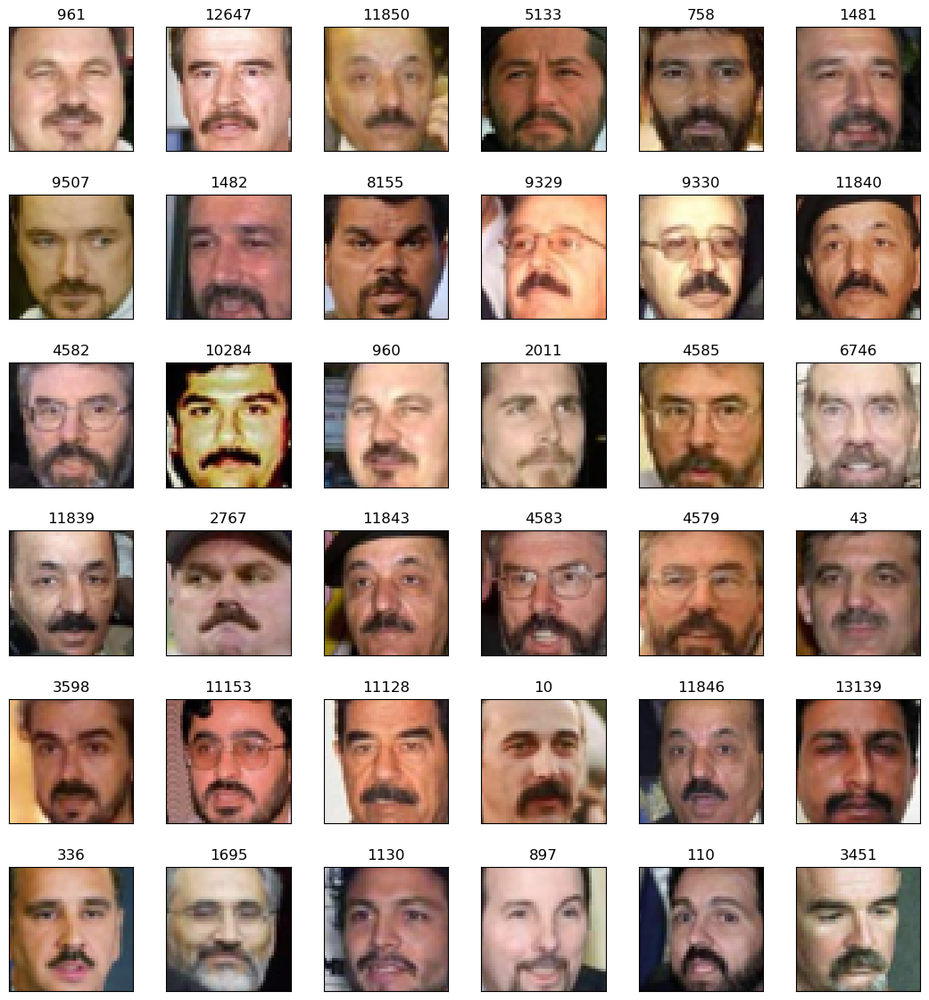

In [17]:
plot_gallery(mustache_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=mustache_ids)

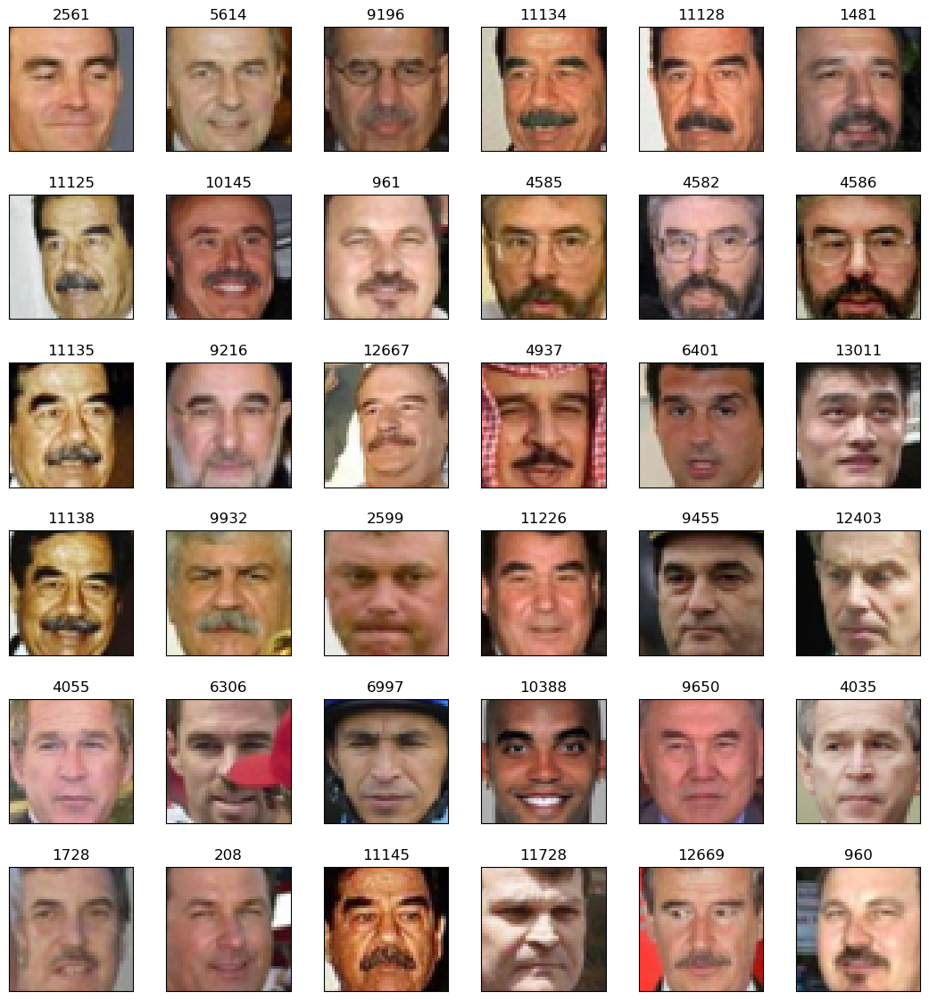

In [18]:
plot_gallery(male_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=male_ids)

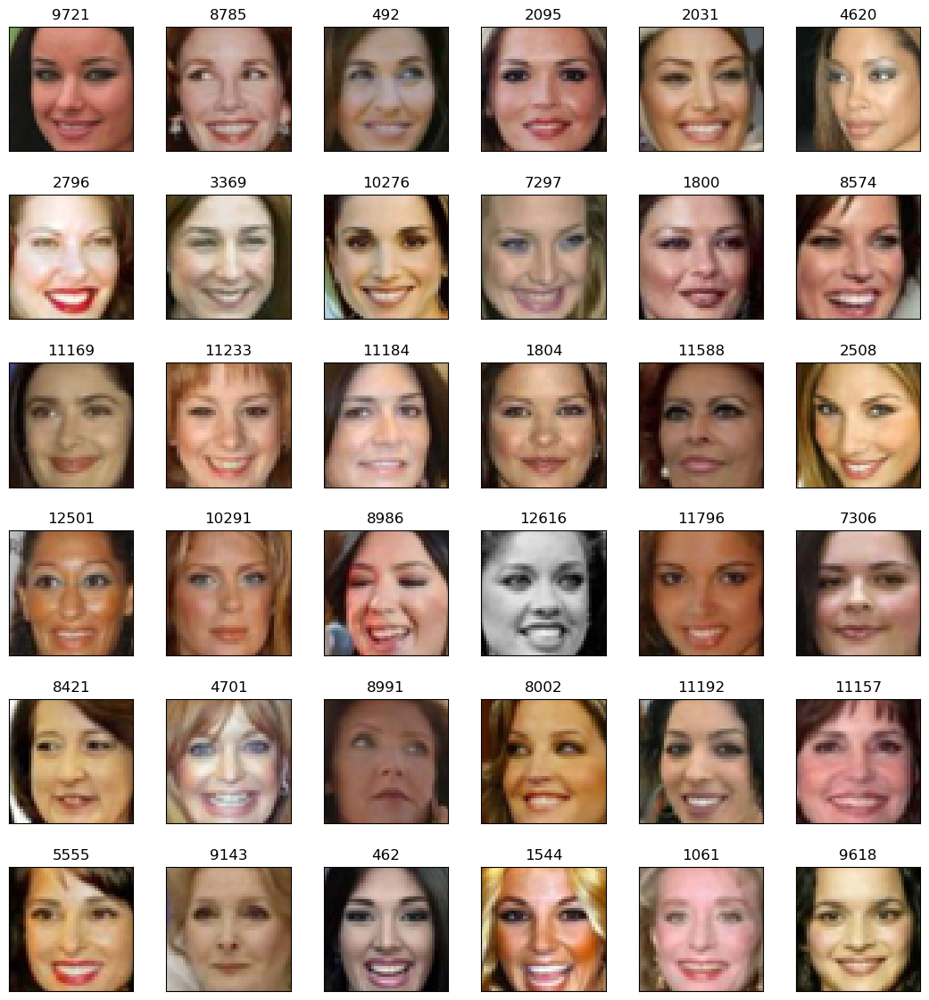

In [19]:
plot_gallery(female_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=female_ids)

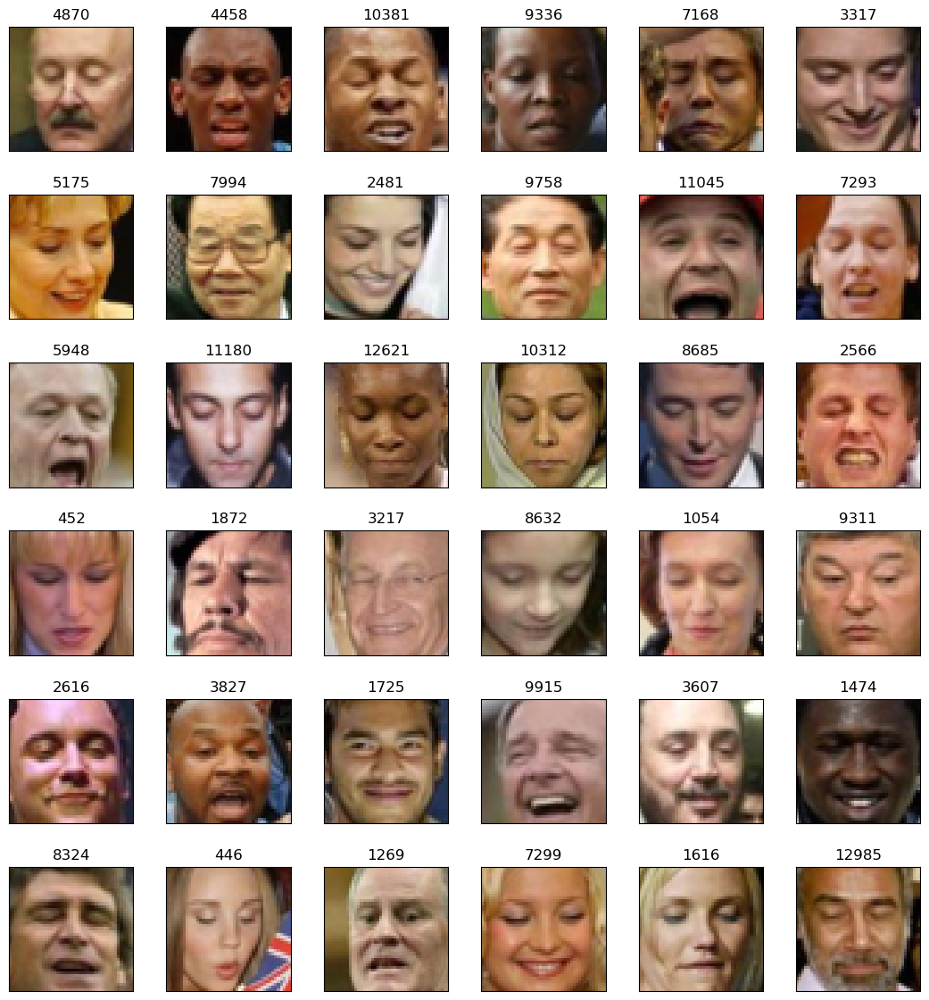

In [20]:
plot_gallery(eyeclosed_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=eyeclosed_ids)

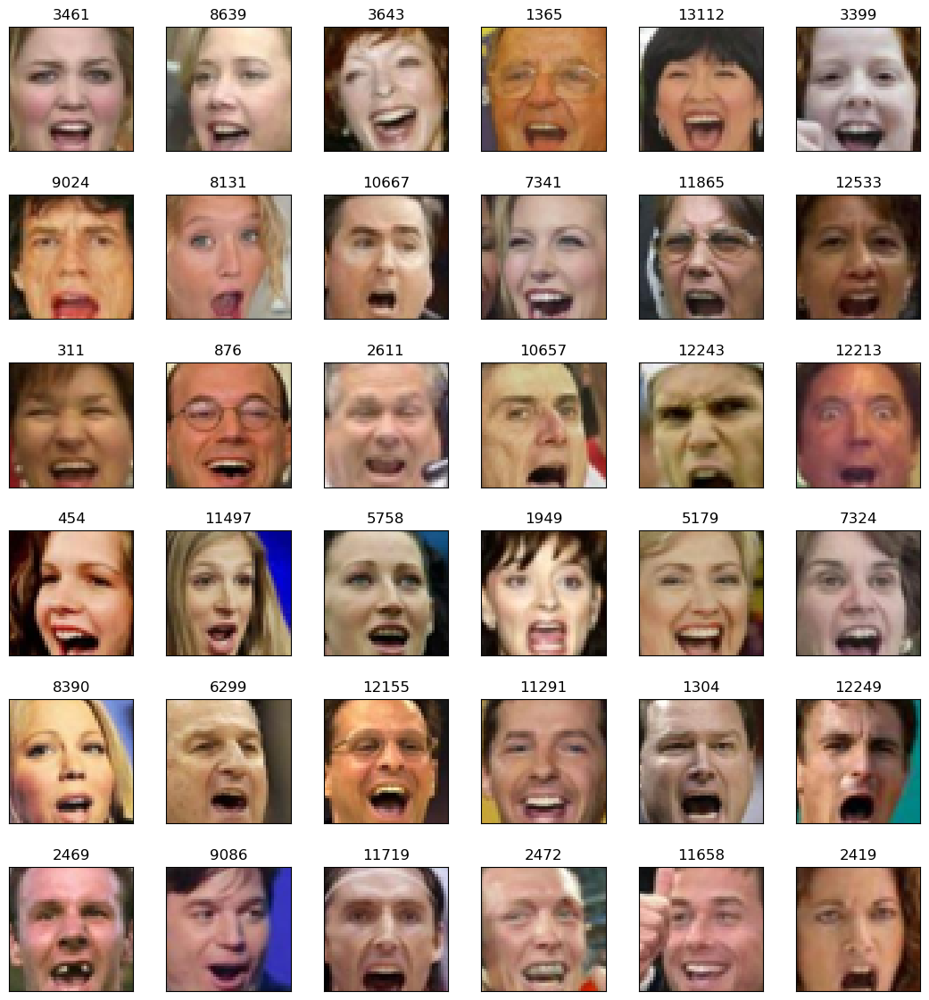

In [21]:
plot_gallery(mouthopen_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=mouthopen_ids)

In [ ]:
plot_gallery(makeup_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=makeup_ids)

### Constructing the encoder

Recall that the encoder part of the VAE architecture maps a data point to a variational mean and (log) variance. The mean is a point in the latent space.


In [22]:
LATENT_SPACE_SIZE = 100

The "reparameterization trick" draws samples from the variational distribution that are parameterized by the variational mean and variance, so that the parameters of the encoder network can be trained.


In [23]:
def sample_latent_features(distribution):
    distribution_mean, distribution_variance = distribution
    batch_size = tensorflow.shape(distribution_variance)[0]
    random = tensorflow.keras.backend.random_normal(shape=(batch_size, tensorflow.shape(distribution_variance)[1]))
    return distribution_mean + tensorflow.exp(0.5 * distribution_variance) * random

In [24]:
input_data = tensorflow.keras.layers.Input(shape=(45, 45, 3))

encoder = tensorflow.keras.layers.Conv2D(64, (5,5), activation='relu')(input_data)
encoder = tensorflow.keras.layers.MaxPooling2D((2,2))(encoder)

encoder = tensorflow.keras.layers.Conv2D(64, (3,3), activation='relu')(encoder)
encoder = tensorflow.keras.layers.MaxPooling2D((2,2))(encoder)

encoder = tensorflow.keras.layers.Conv2D(32, (3,3), activation='relu')(encoder)
encoder = tensorflow.keras.layers.MaxPooling2D((2,2))(encoder)

encoder = tensorflow.keras.layers.Flatten()(encoder)

distribution_mean = tensorflow.keras.layers.Dense(LATENT_SPACE_SIZE, name='variational_mean')(encoder)
distribution_variance = tensorflow.keras.layers.Dense(LATENT_SPACE_SIZE, name='variational_log_variance')(encoder)
latent_encoding = tensorflow.keras.layers.Lambda(sample_latent_features)([distribution_mean, distribution_variance])

encoder_model = tensorflow.keras.Model(input_data, latent_encoding)
encoder_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 45, 45, 3)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 41, 41, 64)   4864        ['input_1[0][0]']                
                                                                                                  
 max_pooling2d (MaxPooling2D)   (None, 20, 20, 64)   0           ['conv2d[0][0]']                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 18, 18, 64)   36928       ['max_pooling2d[0][0]']          
                                                                                              

### Construct the decoder

The decoder network in the VAE architecture maps a latent vector to an image.
This is done with a series of transposed convolutional layers, since it must
map from low to high dimensions.


In [25]:
decoder_input = tensorflow.keras.layers.Input(shape=LATENT_SPACE_SIZE)
decoder = tensorflow.keras.layers.Reshape((1, 1, 100))(decoder_input)
decoder = tensorflow.keras.layers.Conv2DTranspose(64, (3,3), activation='relu')(decoder)
decoder = tensorflow.keras.layers.UpSampling2D((2,2))(decoder)

decoder = tensorflow.keras.layers.Conv2DTranspose(32, (3,3), activation='relu')(decoder)
decoder = tensorflow.keras.layers.UpSampling2D((2,2))(decoder)

decoder = tensorflow.keras.layers.Conv2DTranspose(16, (5,5), activation='relu')(decoder)
decoder = tensorflow.keras.layers.UpSampling2D((2,2))(decoder)

decoder_output = tensorflow.keras.layers.Conv2DTranspose(3, (6,6), activation='relu')(decoder)

decoder_model = tensorflow.keras.Model(decoder_input, decoder_output)
decoder_model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 100)]             0         
                                                                 
 reshape (Reshape)           (None, 1, 1, 100)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 3, 3, 64)         57664     
 nspose)                                                         
                                                                 
 up_sampling2d (UpSampling2D  (None, 6, 6, 64)         0         
 )                                                               
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 8, 8, 32)         18464     
 ranspose)                                                       
                                                           

In [26]:
encoded = encoder_model(input_data)
decoded = decoder_model(encoded)
autoencoder = tensorflow.keras.models.Model(input_data, decoded)

In [27]:
def get_loss(distribution_mean, distribution_variance, factor, batch_size):

    def get_reconstruction_loss(y_true, y_pred, factor, batch_size):
        reconstruction_loss = tensorflow.math.squared_difference(y_true, y_pred)
        reconstruction_loss_batch = tensorflow.reduce_sum(reconstruction_loss)/batch_size
        return 0.5*reconstruction_loss_batch*factor

    def get_kl_loss(distribution_mean, distribution_variance, batch_size):
        kl_loss = LATENT_SPACE_SIZE + distribution_variance - tensorflow.square(distribution_mean) - tensorflow.exp(distribution_variance)
        kl_loss_batch = tensorflow.reduce_sum(kl_loss)/batch_size
        return kl_loss_batch*(-0.5)

    def total_loss(y_true, y_pred):
        reconstruction_loss_batch = get_reconstruction_loss(y_true, y_pred, factor, batch_size)
        kl_loss_batch = get_kl_loss(distribution_mean, distribution_variance, batch_size)
        return reconstruction_loss_batch + kl_loss_batch

    return total_loss

### 1.1 Deriving the loss function (5 points)

Derive the loss function defined in the cell above from the probability model perspective. You can ignore the scalar `factor` in your derivation. Show your work using either LaTeX or a picture of your written solution.

Hint: Think about how how the total loss is related to the ELBO.

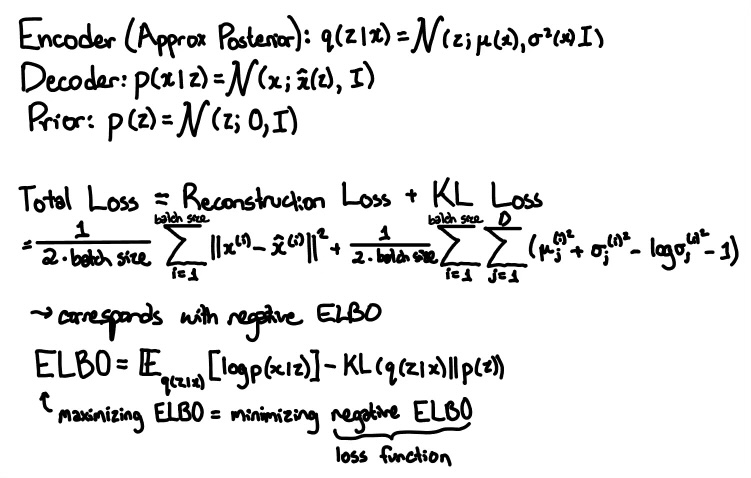

The following three cells train the model. You can just run them. It may take a while to run on your laptop.

In [28]:
X_train, X_val = train_test_split(data, test_size=0.2, random_state=365)

In [29]:
batch_size = 64
autoencoder.compile(loss=get_loss(distribution_mean, distribution_variance, factor = 100,
                                  batch_size = batch_size), optimizer='adam')
autoencoder.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 45, 45, 3)]       0         
                                                                 
 model (Functional)          (None, 100)               118056    
                                                                 
 model_1 (Functional)        (None, 45, 45, 3)         90675     
                                                                 
Total params: 208,731
Trainable params: 208,731
Non-trainable params: 0
_________________________________________________________________


In [30]:
autoencoder.fit(X_train, X_train, epochs=50, batch_size=64, validation_data=(X_val, X_val))

Train on 10514 samples, validate on 2629 samples
Epoch 1/50
   64/10514 [..............................] - ETA: 26s - loss: 75091.6719

2024-11-03 12:36:49.073300: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:353] MLIR V1 optimization pass is not enabled
2024-11-03 12:36:49.078126: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2024-11-03 12:36:49.094549: W tensorflow/c/c_api.cc:300] Operation '{name:'training/Adam/variational_log_variance/kernel/v/Assign' id:914 op device:{requested: '', assigned: ''} def:{{{node training/Adam/variational_log_variance/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/variational_log_variance/kernel/v, training/Adam/variational_log_variance/kernel/v/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


10514/10514 [==============================] - ETA: 0s - loss: 8969.5807

/opt/homebrew/Caskroom/miniconda/base/envs/iml_updated/lib/python3.11/site-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2024-11-03 12:36:56.242888: W tensorflow/c/c_api.cc:300] Operation '{name:'loss/mul' id:500 op device:{requested: '', assigned: ''} def:{{{node loss/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](loss/mul/x, loss/model_1_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


10514/10514 [==============================] - 8s 754us/sample - loss: 8969.5807 - val_loss: 2816.0992
Epoch 2/50
10514/10514 [==============================] - 8s 767us/sample - loss: 1838.2009 - val_loss: 1802.3426
Epoch 3/50
10514/10514 [==============================] - 8s 784us/sample - loss: 688.6926 - val_loss: 484.7459
Epoch 4/50
10514/10514 [==============================] - 8s 808us/sample - loss: 71.2781 - val_loss: -106.0968
Epoch 5/50
10514/10514 [==============================] - 9s 831us/sample - loss: -249.1094 - val_loss: -417.3089
Epoch 6/50
10514/10514 [==============================] - 9s 843us/sample - loss: -452.2187 - val_loss: -613.7619
Epoch 7/50
10514/10514 [==============================] - 9s 857us/sample - loss: -727.7918 - val_loss: -895.0336
Epoch 8/50
10514/10514 [==============================] - 9s 864us/sample - loss: -984.4767 - val_loss: -863.9880
Epoch 9/50
10514/10514 [==============================] - 9s 861us/sample - loss: -1105.8805 - val_loss

In [32]:
#Save your trained model (for later use)

# autoencoder.save("My_Trained_VAE")
# encoder_model.save("My_Trained_encoder")
# decoder_model.save("My_Trained_decoder")

2024-11-03 12:50:11.253807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs_1' with dtype float and shape [?,100]
	 [[{{node inputs_1}}]]
2024-11-03 12:50:11.255631: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs_1' with dtype float and shape [?,100]
	 [[{{node inputs_1}}]]
2024-11-03 12:50:11.292614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,?,?,100]
	 [[{{node inputs}}]]
2024

INFO:tensorflow:Assets written to: My_Trained_VAE/assets


INFO:tensorflow:Assets written to: My_Trained_VAE/assets
2024-11-03 12:50:12.095386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs_1' with dtype float and shape [?,100]
	 [[{{node inputs_1}}]]
2024-11-03 12:50:12.097503: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs_1' with dtype float and shape [?,100]
	 [[{{node inputs_1}}]]
2024-11-03 12:50:12.187282: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs_1' with d

INFO:tensorflow:Assets written to: My_Trained_encoder/assets


INFO:tensorflow:Assets written to: My_Trained_encoder/assets
2024-11-03 12:50:12.328151: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,?,?,100]
	 [[{{node inputs}}]]
2024-11-03 12:50:12.334140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,?,?,?]
	 [[{{node inputs}}]]
2024-11-03 12:50:12.346593: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with d

2024-11-03 12:50:12.531483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,?,?,32]
	 [[{{node inputs}}]]
2024-11-03 12:50:12.538160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,?,?,?]
	 [[{{node inputs}}]]
2024-11-03 12:50:12.541665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,?,?,16]
	 [[{{node inputs}}]]
2024-11-

INFO:tensorflow:Assets written to: My_Trained_decoder/assets


INFO:tensorflow:Assets written to: My_Trained_decoder/assets


If you experience issues while training the models above or if the process is taking too long, you may also use our pre-trained versions of the VAE, encoder, and decoder, which are available on Canvas.

No points will be taken off if you decide to use the pre-trained models, but we do recommend trying out the training process above. In case you encounter any issues when loading in the models, please post your questions on Ed discussion.

In [ ]:
# Load Pre-trained Model

# batch_size = 64
# autoencoder = tensorflow.keras.models.load_model("Trained_VAE",compile=False)
# autoencoder.compile(loss=get_loss(distribution_mean, distribution_variance, factor = 100, batch_size = batch_size), optimizer='Adam')

# encoder_model = tensorflow.keras.models.load_model("Trained_encoder",compile=False)
# encoder_model.compile(loss=get_loss(distribution_mean, distribution_variance, factor = 100, batch_size = batch_size), optimizer='Adam')

# decoder_model = tensorflow.keras.models.load_model("Trained_decoder",compile=False)
# decoder_model.compile(loss=get_loss(distribution_mean, distribution_variance, factor = 100, batch_size = batch_size), optimizer='Adam')

### 1.2 Reconstructing faces (3 points)

The following cell encodes and reconstructs 16 random faces from the validation set with the trained VAE. Run the cell and comment on the reconstructed faces. (3 points)
* Do the reconstructed faces resemble the original images? How are they similar/different?
* Are there any faces that are reconstructed better or worse than the others? Can you think of why?
* Comment on any other aspects of your findings that are interesting to you.

/opt/homebrew/Caskroom/miniconda/base/envs/iml_updated/lib/python3.11/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-11-03 12:50:27.341757: W tensorflow/c/c_api.cc:300] Operation '{name:'model_1/conv2d_transpose_3/Relu' id:460 op device:{requested: '', assigned: ''} def:{{{node model_1/conv2d_transpose_3/Relu}} = Relu[T=DT_FLOAT, _has_manual_control_dependencies=true](model_1/conv2d_transpose_3/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


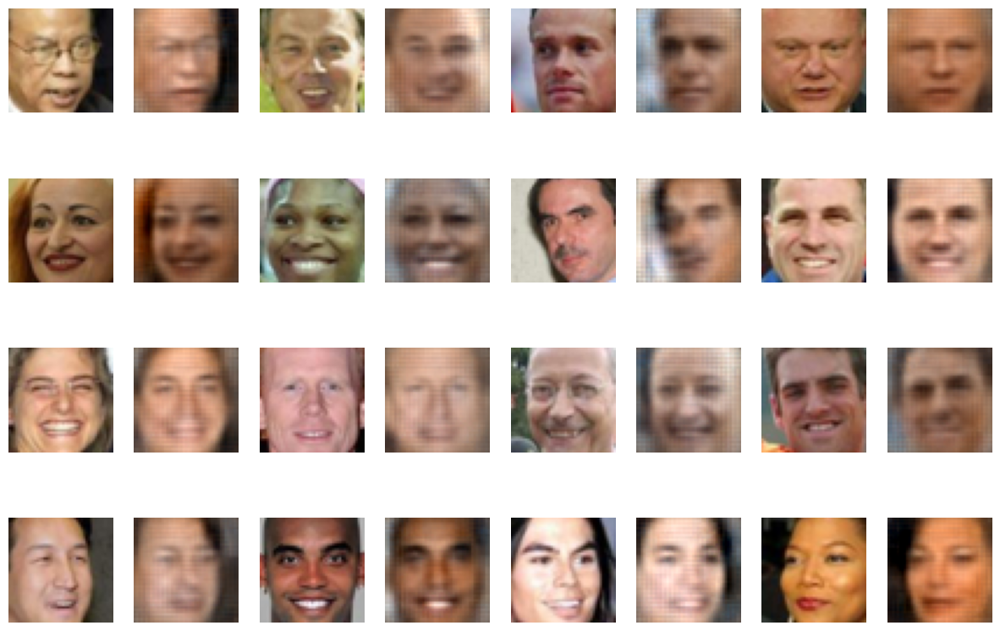

In [33]:
sample_index = random.sample(range(1, len(X_val)), 16)

fig, axs = plt.subplots(4, 8)
fig.set_figheight(10)
fig.set_figwidth(15)

for i in range(4):
    for j in range(4):
        axs[i, 2*j].imshow(X_val[sample_index[4*i+j], :, :, :])
        axs[i, 2*j].axis('off')
        axs[i, 2*j+1].imshow(np.clip(autoencoder.predict(np.array([X_val[sample_index[4*i+j], :, :, :]]))[0],0,1))
        axs[i, 2*j+1].axis('off')

<span style="color:crimson">Answer:</span> The reconstructed faces do resemble the original images but are somewhat fuzzier/grainier in resolution. The smiling faces seem to be reconstructed better than the non smiling faces. It is possible that this is a function of the data itself (the set could have more smiling faces than non-smiling faces). Additionally, smiling faces often have more consistent and pronounced features (e.g., curved mouth, visible teeth) compared to non-smiling faces, which can vary more in expression. This consistency makes it easier for the VAE to learn and reproduce these features accurately.

### 1.3 Visualizing the latent space (10 points)

In `vae_demo` from class, the MNIST digits were generated from a two-dimensional latent space. In the current model, the latent space has more than two dimensions, so to visualize it we need to use a dimensionality reduction technique. (If you are not familiar with PCA, please refer to the material for Week 7 of [iML](https://ydata123.org/fa21/iml/calendar.html).)

In this problem, you will first implement the function `LatentSpace_2D`. (6 points)
1. Calculate the latent space encodings for two sets of faces that are different in one attribute, e.g. smile vs. no smile.
2. Use PCA to reduce the dimension of the latent space codes to two.
3. Visualize the latent space after dimensionality reduction with a scatter plot. Clearly color-code and label the two different groups.

Here is an example using smile_data and no_smile_data.
![Sample_1_3](https://raw.githubusercontent.com/YData123/sds365-sp22/main/assignments/assn3/Sample_1_3.png)

Visualize the latent space for at least three pairs of face groups including smile vs. no smile. Comment on how the scatter plots look.
* Are the two groups separable in the two-dimensional latent space? Is this what you expected? Why or why not? (2 points)
* How do the plots for the three different attributes differ from each other? (2 points)

In [38]:
def LatentSpace_2D(encoder_model, data1, label1, data2, label2):
    # Step 1: Encode both datasets to obtain the latent means
    # Assuming the encoder_model returns [mean, log_variance]
    mean1 = encoder_model.predict(data1)
    mean2 = encoder_model.predict(data2)
    
    # Step 2: Concatenate the latent means and corresponding labels
    latent_codes = np.concatenate([mean1, mean2], axis=0)
    labels = np.concatenate([np.full(mean1.shape[0], label1),
                             np.full(mean2.shape[0], label2)], axis=0)
    
    # Step 3: Apply PCA to reduce latent dimensions to 2
    pca = PCA(n_components=2)
    latent_2d = pca.fit_transform(latent_codes)
    
    # Step 4: Create a scatter plot of the reduced latent space
    plt.figure(figsize=(10, 8))
    
    # Scatter plot for the first group
    plt.scatter(latent_2d[:len(data1), 0], latent_2d[:len(data1), 1],
                c='blue', alpha=0.5, label=label1)
    
    # Scatter plot for the second group
    plt.scatter(latent_2d[len(data1):, 0], latent_2d[len(data1):, 1],
                c='orange', alpha=0.5, label=label2)
    
    # Adding labels and title
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.title('2D Visualization of Latent Space')
    plt.legend()
    plt.grid(True)
    plt.show()

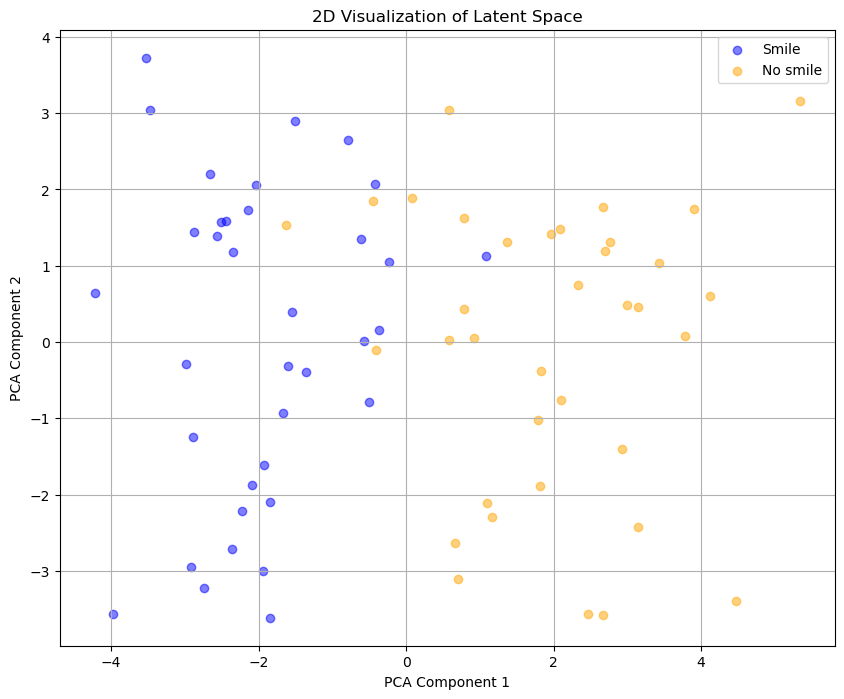

In [39]:
LatentSpace_2D(encoder_model, smile_data, 'Smile', no_smile_data, 'No smile')

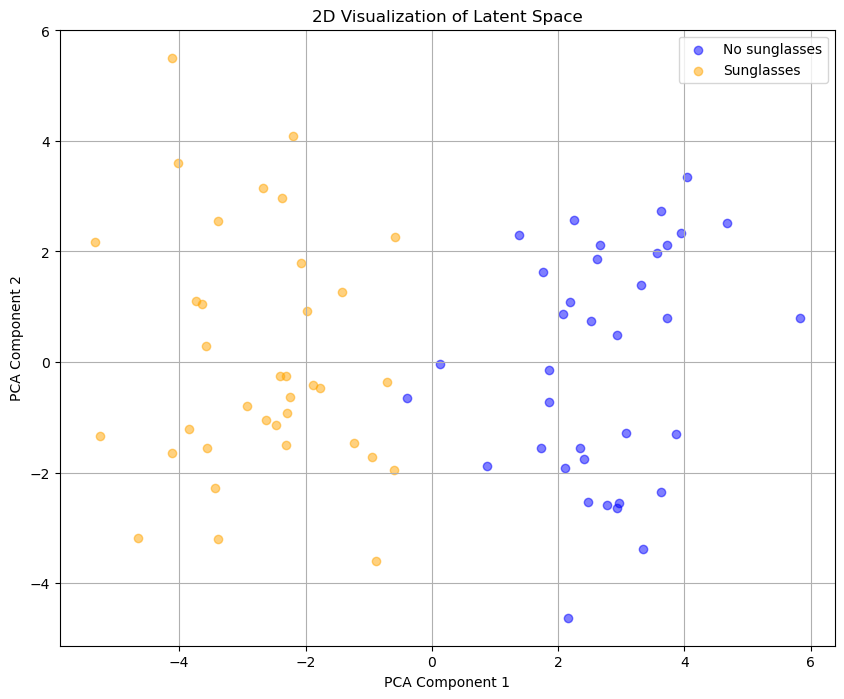

In [40]:
LatentSpace_2D(encoder_model,smile_data,'No sunglasses',sunglasses_data,'Sunglasses')

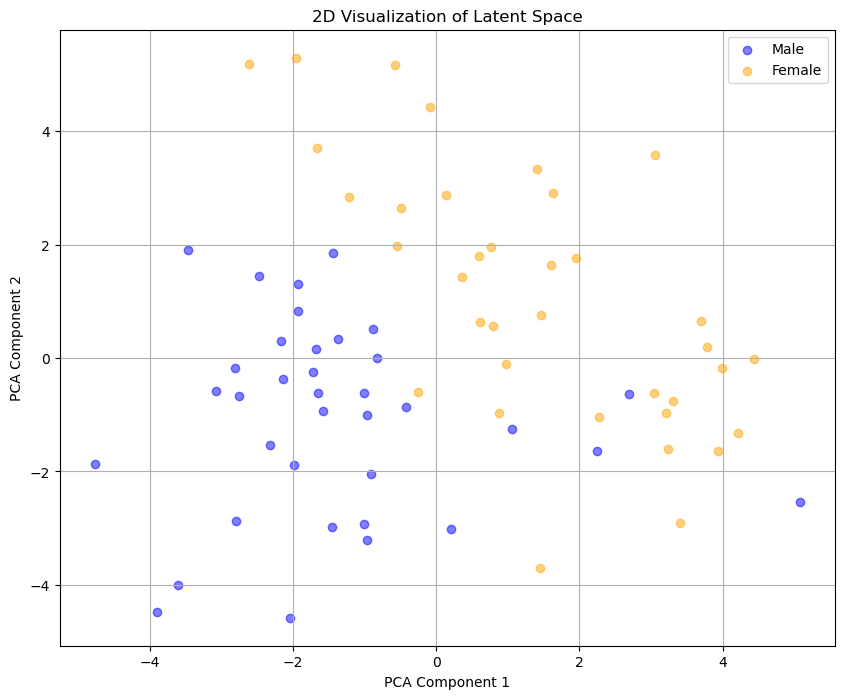

In [41]:
LatentSpace_2D(encoder_model,male_data,'Male',female_data,'Female')

<span style="color:crimson">Answer:</span> For all plots, the two groups are quite separable in the two-dimensional latent space, with Gender having some overlap. This is largely what I expected because it is very easy to discern between a smile vs no smile or sunglasses vs no sunglasses. While gender is often easy to tell apart, it is probably the most difficult task since humans all have the same facial features. The plots all show different levels of separation between the labels, with the greatest for sunglasses, and the smallest for Gender.


### 1.4 Morphing between faces (4 points)

Morph at least 5 pairs of faces with the function `morphBetweenImages` and comment on what you observe.
* Briefly explain how the morphing works. (2 points)
* Do the generated faces look like what you expected? Does any of the pairs work better than the others? If so, what kind of image pairs work better? (2 points)

In [42]:
# Don't change the function
def morphBetweenImages(img1, img2, num_of_morphs):
    alpha = np.linspace(0,1,num_of_morphs)
    z1 = encoder_model.predict(np.array([img1]))
    z2 = encoder_model.predict(np.array([img2]))
    fig = plt.figure(figsize=(30,5))

    ax = fig.add_subplot(1, num_of_morphs+2, 1)
    ax.imshow(img1)
    ax.axis('off')
    ax.set_title(loc='center', label='original image 1',fontsize=10)

    for i in range(num_of_morphs):
        z = z1*(1-alpha[i]) + z2*alpha[i]
        new_img = decoder_model.predict(z)

        ax = fig.add_subplot(1, num_of_morphs+2, i+2)
        ax.imshow(np.clip(new_img.squeeze(),0,1))
        ax.axis('off')
        ax.set_title(loc='center', label='alpha={:.2f}'.format(alpha[i]))

    ax = fig.add_subplot(1, num_of_morphs+2, num_of_morphs+2)
    ax.imshow(img2)
    ax.axis('off')
    ax.set_title(loc='center', label='original image 2',fontsize=10)
    return

/opt/homebrew/Caskroom/miniconda/base/envs/iml_updated/lib/python3.11/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-11-03 13:58:31.143505: W tensorflow/c/c_api.cc:300] Operation '{name:'conv2d_transpose_3/Relu' id:317 op device:{requested: '', assigned: ''} def:{{{node conv2d_transpose_3/Relu}} = Relu[T=DT_FLOAT, _has_manual_control_dependencies=true](conv2d_transpose_3/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


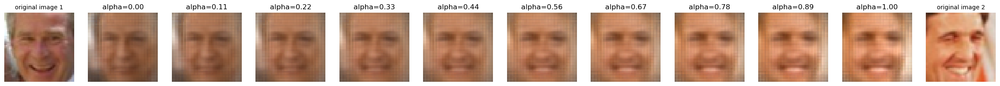

In [43]:
sample_index = random.sample(range(1, len(data)), 2)
morphBetweenImages(data[sample_index[0]],data[sample_index[1]],10)

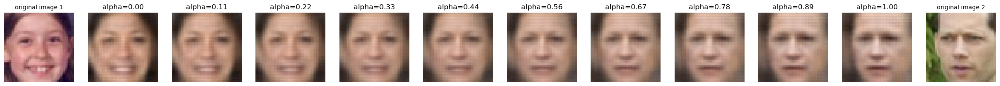

In [46]:
#Smiling to Not Smiling

smile_sample = smile_data[random.randint(0, len(smile_data)-1)]
no_smile_sample = no_smile_data[random.randint(0, len(no_smile_data)-1)]

morphBetweenImages(smile_sample, no_smile_sample, 10)

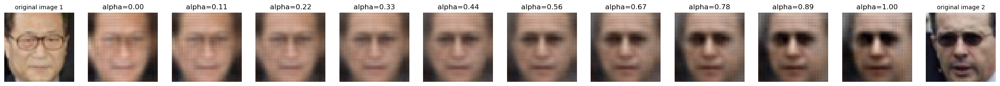

In [53]:
#Eyeglasses to Sunglasses

eyeglass_sample = eyeglasses_data[random.randint(0, len(eyeglasses_data)-1)]
sunglass_sample = sunglasses_data[random.randint(0, len(sunglasses_data)-1)]

morphBetweenImages(eyeglass_sample, sunglass_sample, 10)

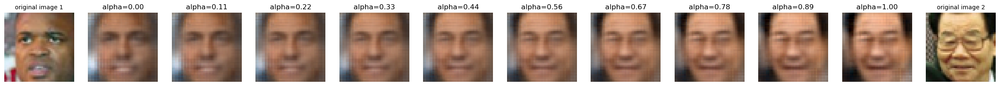

In [56]:
#Open eyes to closed eyes

open_sample = eyeopen_data[random.randint(0, len(eyeopen_data)-1)]
closed_sample = eyeclosed_data[random.randint(0, len(eyeclosed_data)-1)]

morphBetweenImages(open_sample, closed_sample, 10)

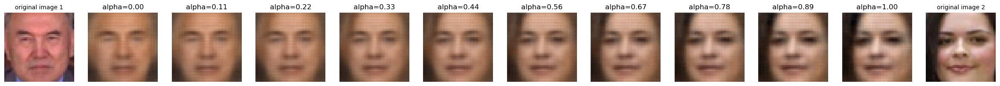

In [57]:
#Male to female

male_sample = male_data[random.randint(0, len(male_data)-1)]
female_sample = female_data[random.randint(0, len(female_data)-1)]

morphBetweenImages(male_sample, female_sample, 10)

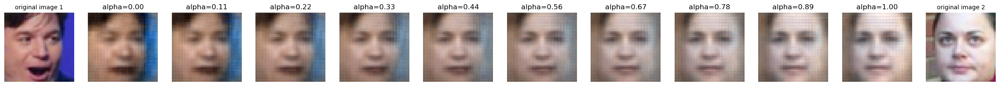

In [58]:
#Mouth open to eye open
mouthopen_sample = mouthopen_data[random.randint(0, len(mouthopen_data)-1)]
eyeopen_sample = eyeopen_data[random.randint(0, len(eyeopen_data)-1)]

morphBetweenImages(mouthopen_sample, eyeopen_sample, 10)

<span style="color:crimson">Answer:</span> Morphing between image pairs using a VAE leverages the model's ability to capture and manipulate high-level features in a compressed latent space. By interpolating between latent vectors, you can explore the continuum of variations within the data, observing how specific attributes change seamlessly from one state to another. 

For pairs that work well together, I would expect a smooth and gradual transition between the faces with consistency and presservation of important features. This seems to be the case with all of the five pairs I have chosen, so I don't think any one pair works better than another.

### 1.5 Attribute shift (10 points)

In 1.3, we've seen that faces with the same attributes form clusters in the latent space. In this problem, you will implement a function `AttributeShift` to change one attribute of the faces.

First implement the function `AttributeShift`. (5 points)
1. Calculate the latent space codes for two sets of faces that are different in one attribute, e.g. smile vs. no smile.
2. Calculate the mean latent space code for each group.
3. Get the attribute shifting vector by taking the difference between the two codes.
4. Perform attribute shift by adding the attribute shifting vector to the latent space code of the faces you want to modify.
5. Generate the image using the new latent space codes.

Here is a diagram demonstrating the shift in the latent space. Please note that the two-dimensional latent space is just for demonstration purpose. You should *not* use PCA in this problem. Instead, use the original latent space.
![Diagram_1_5](https://raw.githubusercontent.com/YData123/sds365-sp22/main/assignments/assn3/Diagram_1_5.png)

Perform attribute shift on at three attributes including smile. Comment on the faces with shifted attributes. (5 points)
* Do the generated faces look like what you expected? If not, can you think of some possible reasons?
* Do the faces with new attributes resemble the original faces? If not, can you think of some possible reasons?
* Which of the attribute shift is more successful? What are some possible reasons?
* Comment on any other aspects of your findings that are interesting to you.

In [59]:
# Don't change this helper function!
def PlotAttributeShift(data2,pic_output):
    sample_index = random.sample(range(1, len(data2)), 16)

    fig, axs = plt.subplots(4, 8)
    fig.set_figheight(10)
    fig.set_figwidth(15)

    for i in range(4):
        for j in range(4):
            axs[i, 2*j].imshow(data2[sample_index[4*i+j], :, :, :])
            axs[i, 2*j].axis('off')
            axs[i, 2*j+1].imshow(np.clip(pic_output[sample_index[4*i+j]],0,1))
            axs[i, 2*j+1].axis('off')

In [62]:
def AttributeShift(encoder_model,decoder_model,data1,data2):
    latent1 = encoder_model.predict(data1)
    latent2 = encoder_model.predict(data2)
     
    mean1 = np.mean(latent1, axis=0)
    mean2 = np.mean(latent2, axis=0)
    
    displacement = mean1 - mean2
    
    new_data = latent2 + displacement
    
    pic_output = decoder_model.predict(new_data)
    return pic_output

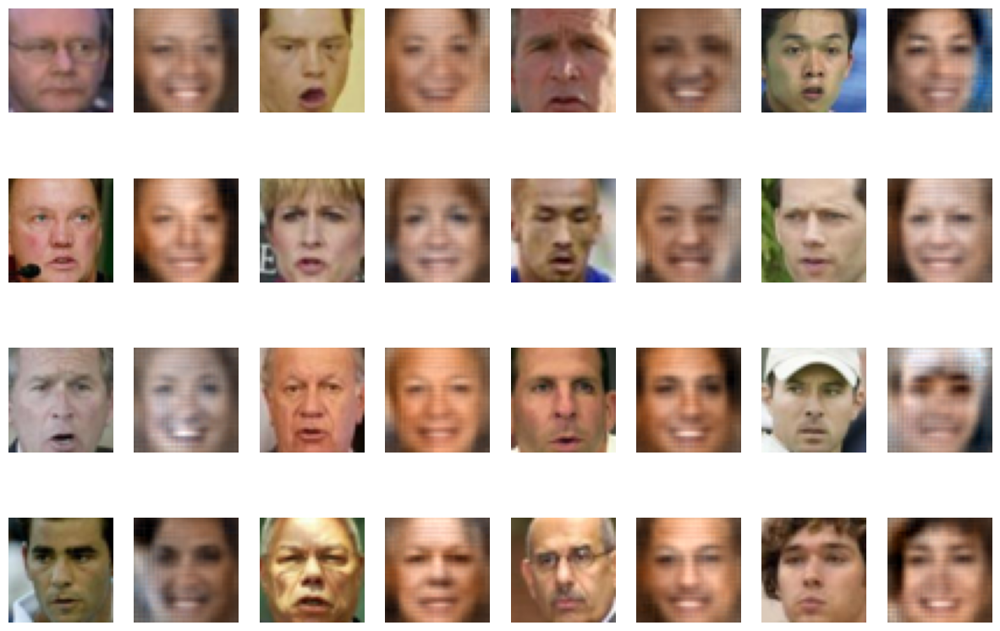

In [63]:
pic_output = AttributeShift(encoder_model,decoder_model,smile_data,no_smile_data)
PlotAttributeShift(no_smile_data,pic_output)

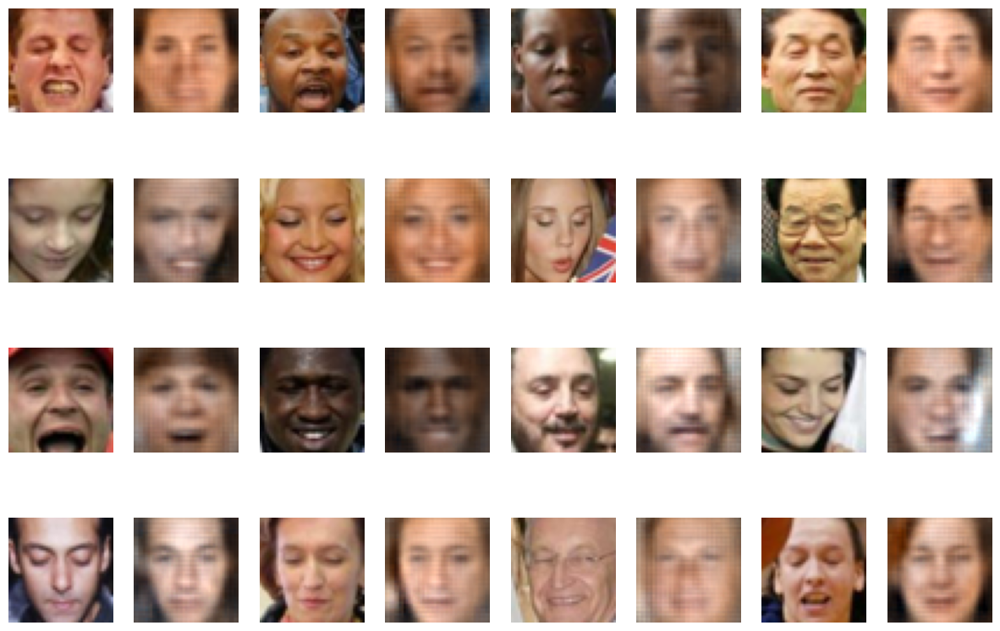

In [64]:
pic_output = AttributeShift(encoder_model,decoder_model,eyeopen_data,eyeclosed_data)
PlotAttributeShift(eyeclosed_data,pic_output)

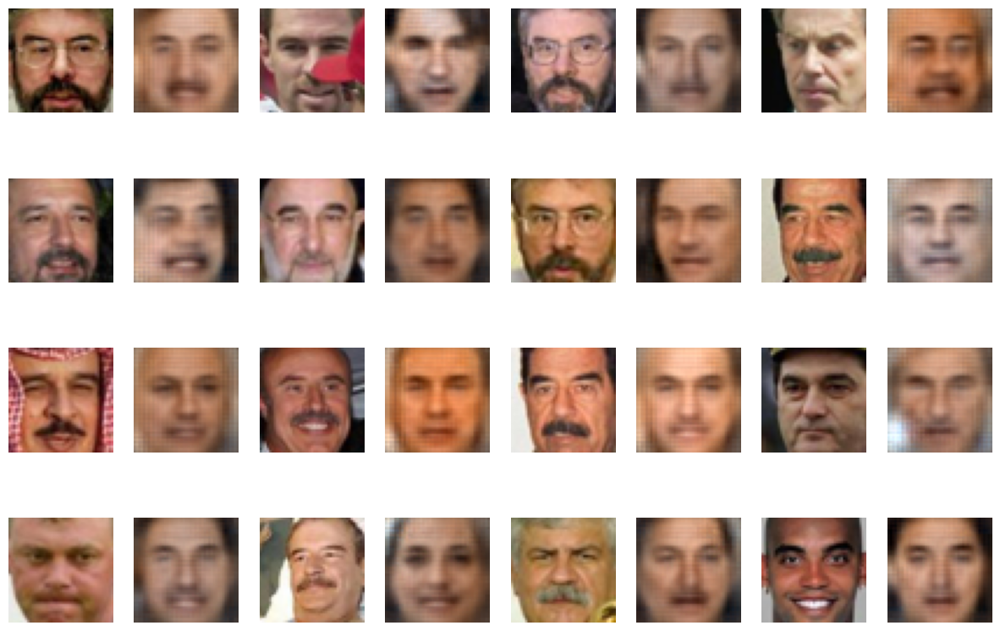

In [68]:
pic_output = AttributeShift(encoder_model,decoder_model,male_data,makeup_data)
PlotAttributeShift(male_data,pic_output)

<span style="color:crimson">Answer:</span> The generated faces look somewhat like what I expected but not every attribute shift was totally successful. For instance, trying to add heavy makeup to the male faces was not as effective opening eyes for people with closed eyes. This is likely because the people with makeup shared other common features that were reflected in the shift, however the change from open eyes to closed eyes is much starker. 
The faces with new attributes do somewhat resemble the original faces, with the exception of the last transition from men to men with makeup. The attribute shift most successful is probably from not smiling to smiling. This makes sense, as a smile is a very distinctive singular feature that can probably be defined very clearly.

### 1.6 Generating new faces (3 points)

Variational autoencoders can be used to generate new data; this is why they are generative models. We can sample new data points from the distribution in latent space and reconstruct new, fake faces based on them.

To draw a sample close to an existing sample in the latent space, we can add a scaled random sample from the normal distribution to the latent space code of an existing sample. The scalar, which we call the `noise_level` is a parameter that we can tune.

Run `GenerateFaces` with three different values of `noise_level` and comment on the generated faces. (3 points)
* Do the generated images look like faces?
* What happens when the new samples diverge more from the existing samples? What is a possible reason?

In [71]:
def GenerateFaces(data, LATENT_SPACE_SIZE, noise_level):
    sample_index = random.sample(range(1, len(data)), 15)
    latent_space = noise_level*np.random.normal(size=(15,LATENT_SPACE_SIZE))+encoder_model.predict(data[sample_index])
    generated_image = decoder_model.predict(latent_space)
    fig = plt.figure(figsize=(15,10))
    for i in range(15):
        ax = fig.add_subplot(3, 5, i+1)
        ax.imshow(np.clip(generated_image[i, :,:,:],0,1))
        ax.axis('off')

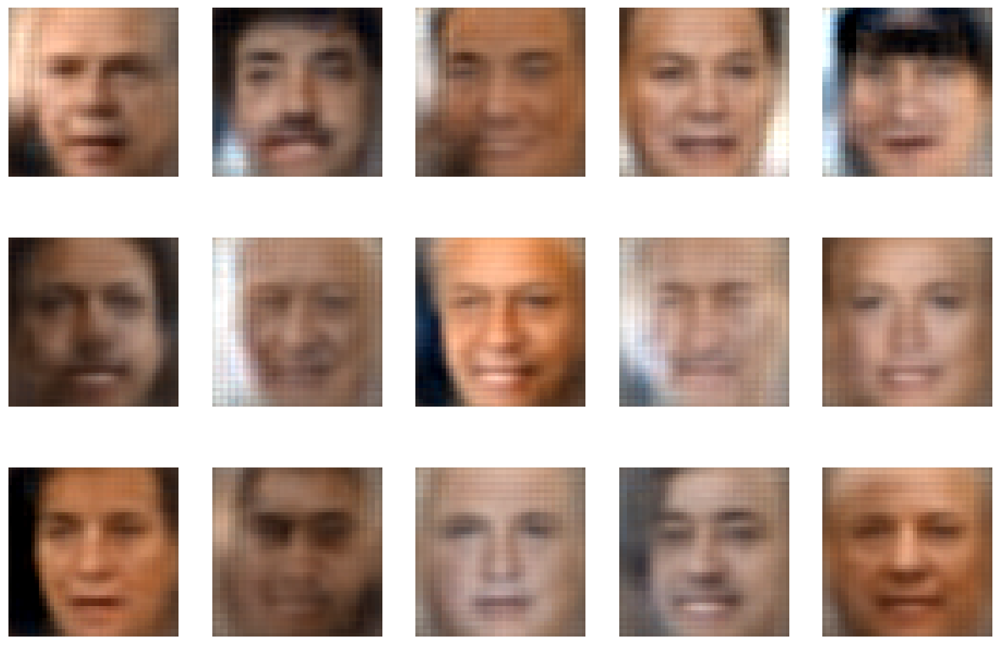

In [72]:
GenerateFaces(data,LATENT_SPACE_SIZE,0.1)

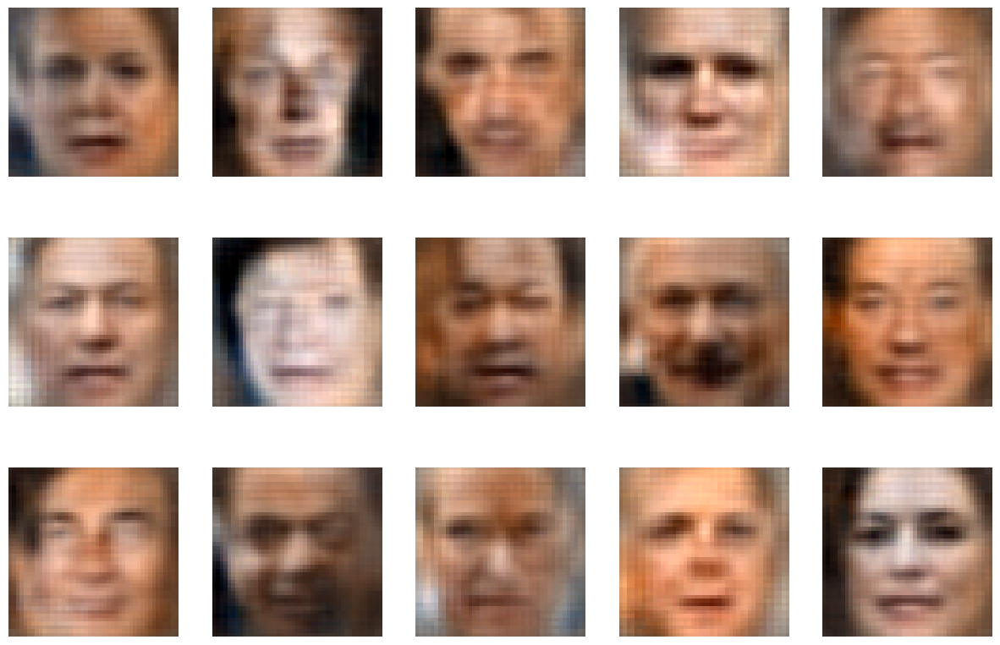

In [73]:
GenerateFaces(data,LATENT_SPACE_SIZE,0.5)

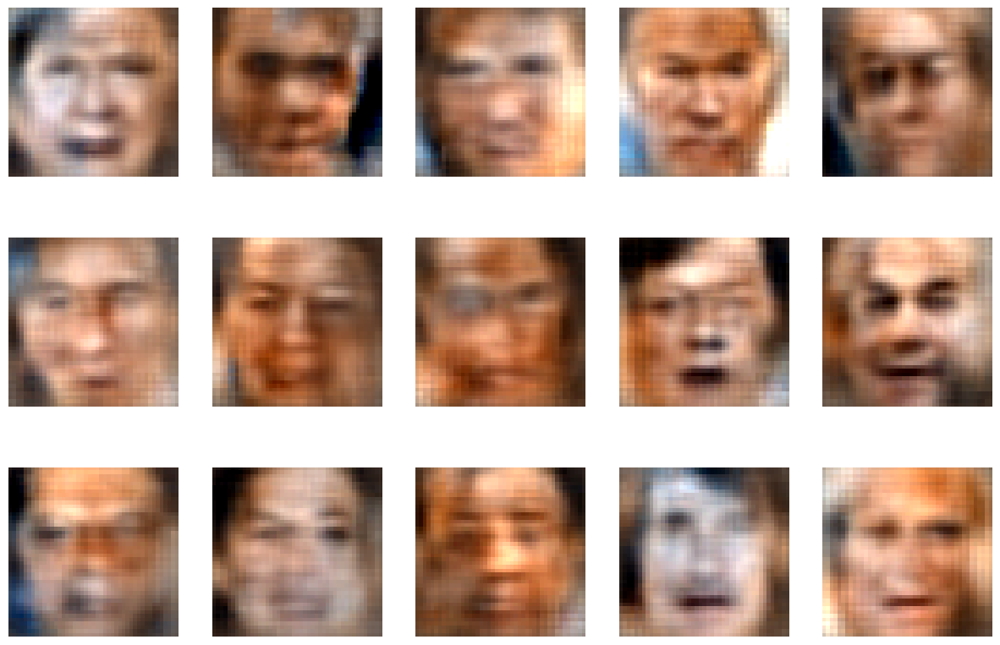

In [74]:
GenerateFaces(data,LATENT_SPACE_SIZE,1)

<span style="color:crimson">Answer:</span> The generated images look more like faces the smaller the noise applied. Selecting the noise_level adjusts how closely the original image is replicated. The images diverge more due to higher noise, which results in more generalized and unique images. 

### Optional: Changing the loss function (2 points extra credit)

The variable `factor` is a parameter of the loss function. In this optional problem, you will play with it and think about its effect on the performance of VAE.

Retrain the model with a smaller factor. Repeat 1.2, 1.6 (using `noise_level` = 1) and latent space visualization. Comment on how the reconstruction results, generated new faces and latent space distributions change. (2 points)
* Which model reconstructs the faces better?
* Do the generated faces look different?
* How do the latent variable distributions differ?
* Do the differences make sense? Can you explain what you observed?

In [123]:
X_train, X_val = train_test_split(data, test_size=0.2, random_state=365)

batch_size = 64
autoencoder.compile(loss=get_loss(distribution_mean, distribution_variance, factor = 10,
                                  batch_size = batch_size), optimizer='adam')
autoencoder.summary()

autoencoder.fit(X_train, X_train, epochs=50, batch_size=64, validation_data=(X_val, X_val))

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 45, 45, 3)]       0         
                                                                 
 model (Functional)          (None, 100)               118056    
                                                                 
 model_1 (Functional)        (None, 45, 45, 3)         90675     
                                                                 
Total params: 208,731
Trainable params: 208,731
Non-trainable params: 0
_________________________________________________________________
Train on 10514 samples, validate on 2629 samples
Epoch 1/50
  128/10514 [..............................] - ETA: 17s - loss: -3090.5092

2024-11-04 14:06:16.984732: W tensorflow/c/c_api.cc:300] Operation '{name:'training_2/Adam/conv2d_transpose_2/bias/m/Assign' id:1838 op device:{requested: '', assigned: ''} def:{{{node training_2/Adam/conv2d_transpose_2/bias/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_2/Adam/conv2d_transpose_2/bias/m, training_2/Adam/conv2d_transpose_2/bias/m/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


10496/10514 [============================>.] - ETA: 0s - loss: -4446.1383

/opt/homebrew/Caskroom/miniconda/base/envs/iml_updated/lib/python3.11/site-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2024-11-04 14:06:25.292045: W tensorflow/c/c_api.cc:300] Operation '{name:'loss_1/mul' id:1493 op device:{requested: '', assigned: ''} def:{{{node loss_1/mul}} = Mul[T=DT_FLOAT, _has_manual_control_dependencies=true](loss_1/mul/x, loss_1/model_1_loss/value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


10514/10514 [==============================] - 9s 885us/sample - loss: -4440.7160 - val_loss: -4525.3679
Epoch 2/50
10514/10514 [==============================] - 10s 917us/sample - loss: -4556.5774 - val_loss: -4541.4795
Epoch 3/50
10514/10514 [==============================] - 9s 898us/sample - loss: -4562.4268 - val_loss: -4544.7473
Epoch 4/50
10514/10514 [==============================] - 9s 895us/sample - loss: -4563.8082 - val_loss: -4543.6129
Epoch 5/50
10514/10514 [==============================] - 9s 879us/sample - loss: -4566.3904 - val_loss: -4547.9637
Epoch 6/50
10514/10514 [==============================] - 9s 877us/sample - loss: -4569.1893 - val_loss: -4549.6400
Epoch 7/50
10514/10514 [==============================] - 9s 883us/sample - loss: -4570.2297 - val_loss: -4557.4139
Epoch 8/50
10514/10514 [==============================] - 9s 901us/sample - loss: -4573.4938 - val_loss: -4538.1299
Epoch 9/50
10514/10514 [==============================] - 10s 918us/sample - loss:

/opt/homebrew/Caskroom/miniconda/base/envs/iml_updated/lib/python3.11/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-11-04 14:15:54.801616: W tensorflow/c/c_api.cc:300] Operation '{name:'model_1/conv2d_transpose_3/Relu' id:460 op device:{requested: '', assigned: ''} def:{{{node model_1/conv2d_transpose_3/Relu}} = Relu[T=DT_FLOAT, _has_manual_control_dependencies=true](model_1/conv2d_transpose_3/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


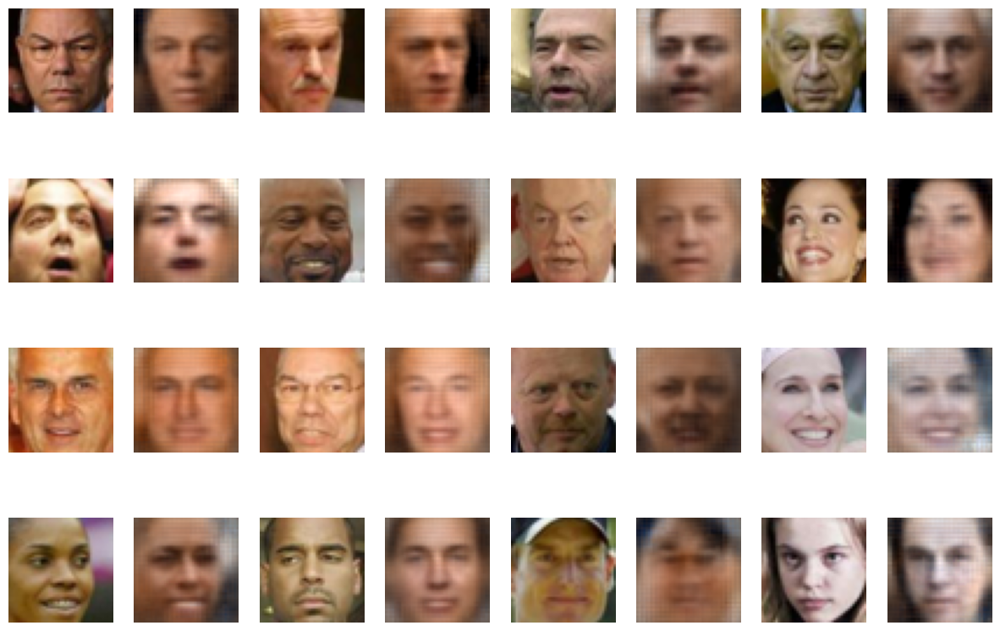

In [124]:
sample_index = random.sample(range(1, len(X_val)), 16)

fig, axs = plt.subplots(4, 8)
fig.set_figheight(10)
fig.set_figwidth(15)

for i in range(4):
    for j in range(4):
        axs[i, 2*j].imshow(X_val[sample_index[4*i+j], :, :, :])
        axs[i, 2*j].axis('off')
        axs[i, 2*j+1].imshow(np.clip(autoencoder.predict(np.array([X_val[sample_index[4*i+j], :, :, :]]))[0],0,1))
        axs[i, 2*j+1].axis('off')

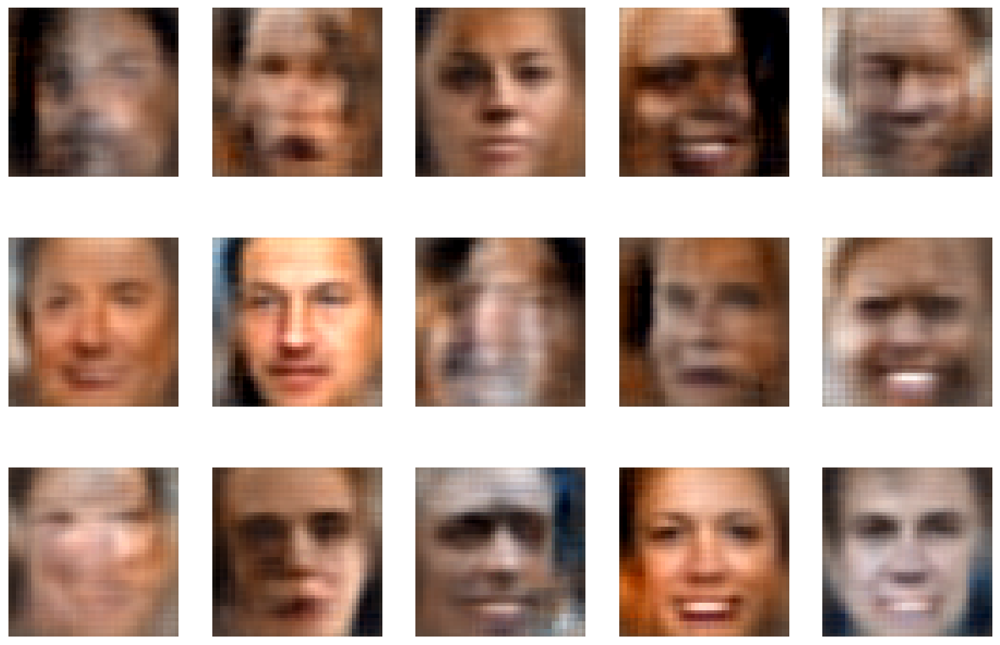

In [125]:
GenerateFaces(data,LATENT_SPACE_SIZE,1)

<span style="color:crimson">Answer:</span> The generated faces in the new model with the smaller factor look more like faces than the ones outputted by the previous model, even with a high noise. The  smaller factor model exhibits a more dispersed latent space with overlapping clusters, indicating less distinct separation between different attribute groups. The differences make sense because the smaller factor of 10 results in reconstructed faces with higher fidelity and preserves more detailed features. The reduced factor diminishes the weight of the KL divergence, allowing the model to focus more on minimizing reconstruction loss.

$\newcommand{\reals}{{\mathbb R}}
\newcommand{\indp}{\perp\kern-4pt\perp}
\newcommand{\given}{\,|\,}
$

## Problem 2: Are you Schur? (10 points)

The graphical lasso is based on conditional independence properties
of Gaussian distributions. This problem asks you to reason about the graphs
underlying a multivariate Gaussian.

Let $X = (Y,Z) \in \reals^6 \sim N(0, \Sigma)$ be a random
Gaussian vector where $Y = (Y_1,Y_2) \in\reals^2$ and
$Z = (Z_1,Z_2,Z_3,Z_4) \in\reals^4$, with
$\Sigma^{-1} = \Omega =  \begin{pmatrix}
A & B \\
B^T & C
\end{pmatrix}
$
where
$$
A = \begin{pmatrix} 2 & 0 \\ 0 & 2\end{pmatrix} \qquad
B = \begin{pmatrix} 1 & \frac{1}{2} & \frac{1}{3} & \frac{1}{4} \\[1pt]
                     -1 & \frac{1}{2} & -\frac{1}{3} & \frac{1}{4}
\end{pmatrix} \qquad
C = \begin{pmatrix}
2 & \frac{1}{2} & 0 & 0 \\
\frac{1}{2} & 2 & 0 & 0 \\
0 & 0 & 2 & \frac{1}{2} \\
0 & 0 & \frac{1}{2} & 2
\end{pmatrix}.
$$

### Problem 2.1

Draw the undirected graph of $X$, arranging the vertices in a hexagon. Explain your answer.

<br>

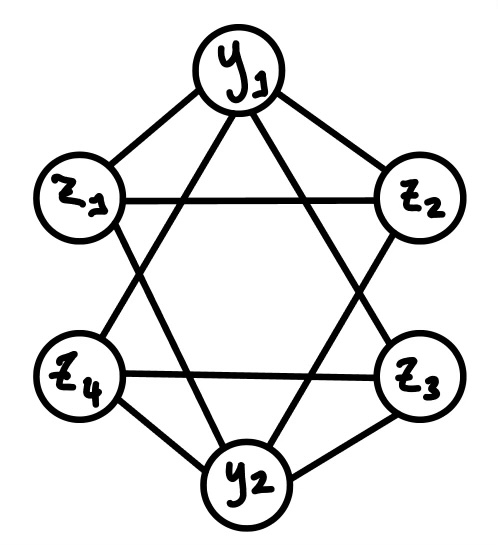

### Problem 2.2

Draw the undirected graph of $Z$, arranging the vertices in a square.  Explain your answer.
Hint:  The
[Schur complement](https://en.wikipedia.org/wiki/Schur_complement)
$ S= C  - B^T A^{-1} B$ has the property that

\begin{equation*}
\begin{pmatrix}
A & B \\
B^T & C
\end{pmatrix}^{-1}
\;=\;
\begin{pmatrix}
A^{-1} + A^{-1} B S^{-1} B ^T A^{-1} & - A^{-1} B S^{-1}  \\
- S^{-1} B^T A^{-1} & S^{-1}
\end{pmatrix}
\end{equation*}


<br>

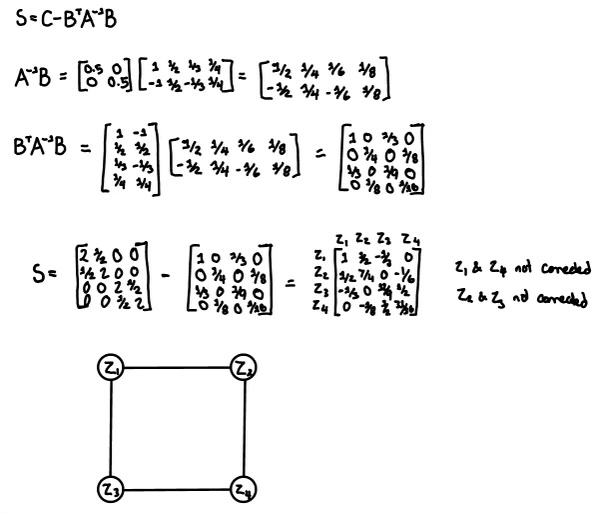

### Problem 2.3

Write down the set of all conditional independence relations on the undirected graph of $X$.

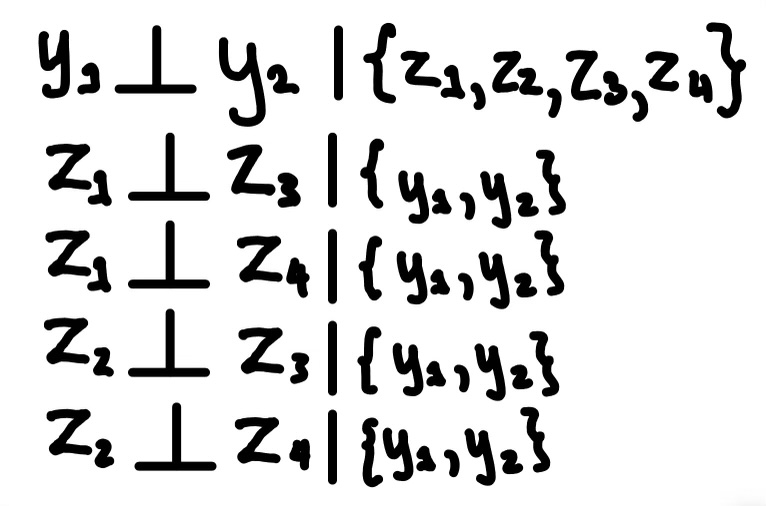


## Problem 3: Taking stock (15 points)

A joint distribution of data has a natural graph associated with it. When the distribution is multivariate normal, this graph is encoded in the pattern of zeros and non-zeros in the inverse of the covariance matrix, also known as the "precision matrix."

In class we demonstrated the graphical lasso for estimating the graph on ETF data.
In this problem you will construct two different "portolios" of stocks,
and run the graphical lasso to estimate a graph, commenting on your results.

All of the code you might need for this is contained in the demo.


### Downloading data

As demonstrated in class, you will run on equities data downloaded from Yahoo finance.
Your job is to construct two "portfolios" of stocks, each of which has some kind of organization to it. For example, in one portfolio you might have 5 energy stocks, 5 tech stocks, 5 consumer staples stocks, and 5 ETF stocks. Each portfolio should have at least 20 stocks.

The page https://en.wikipedia.org/wiki/List_of_S%26P_500_companies has GICS sectors, which you may find useful for the glasso problem.

To download the data, follow the procedure outlined below (and discussed briefly in class):

  * Search on a ticker symbol, like EZA, using [https://finance.yahoo.com/quote/EZA/history?p=EZA](https://finance.yahoo.com/quote/EZA/history?p=EZA)
  * Select the range of the query, the frequency (daily, weekly, or monthly) and then issue the query. This will give you results like this:
  
 ![ezh](https://raw.githubusercontent.com/YData123/sds365-sp22/main/demos/graphs/ezh.png)

  * Next, hover over the Download link, and grab the URL. In this case it gives
  https://query1.finance.yahoo.com/v7/finance/download/EZA?period1=1044576000&period2=1648080000&interval=1d&events=history&includeAdjustedClose=true
  
  * Then, you can use this same URL, but swap in different ticker symbols, to get the corresponding data for range of companies or funds.  


### Analyzing  your portfolios

Your task is to analyze each porfolio using the graphical lasso, and comment on your findings.
Here are the types of questions you should address:

* How did you choose the portolio? How did you choose the date range and frequency (daily, weekly, etc.)? Remember, each of the portfolios must contain at least 20 stocks, and be organized in some reasonable way.

* Display the graph obtained with the graphical lasso, using networkx. How did you choose the regularization level? Does the structure of the graph make sense? Is it sensitive to the choice of regularization level? Is this the structure you expected to see when you designed the portfolio? Why or why not?

* What are some of the conditional independence assumptions implied by the graph? Are some parts of the graph more densely connected than others? Why?




### <span style="color:BlueViolet">**Portfolio 1**</span>

In [83]:
# Tech: AAPL, GOOG, MSFT, AMZN, TSLA 
# Finance: BLK, GS, JPM, BAC
# Pharma: GSK, BMY, PFE
# Fashion: LVMUY, PPRUY
# Entertainment: DIS
# Food: MDLZ, PEP
# Flights: DAL
# Energy: SHEL
# Telecom: T

file_paths = glob.glob("/Users/ananya_krishna/Downloads/portfolio/*.csv")

dataframes = {}

for file in file_paths:
    
    stock_symbol = file.split('/')[-1].split('.')[0]
    df = pd.read_csv(file)
    
    if 'Close/Last' in df.columns:
        
        df.rename(columns={'Close/Last': stock_symbol}, inplace=True)
        df['Date'] = pd.to_datetime(df['Date'])
        df.set_index('Date', inplace=True)

        dataframes[stock_symbol] = df[[stock_symbol]]


combined_df = pd.concat(dataframes.values(), axis=1)

combined_df.sort_index(inplace=True)

combined_df = combined_df.drop(combined_df.index[0])

print(combined_df)

                 T     BAC    SHEL      PEP    MDLZ     LVMUY     PPRUY  \
Date                                                                      
2023-11-06  $15.75  $28.33  $66.83  $166.70  $68.24  $149.415    $42.69   
2023-11-07  $15.84  $28.16  $65.49  $167.18  $68.49   $148.96   $42.735   
2023-11-08  $15.65  $27.89  $64.42  $167.39  $69.02   $150.90    $43.07   
2023-11-09  $15.63  $27.53  $64.81  $166.16  $68.94   $152.13    $43.01   
2023-11-10  $15.64  $27.68  $65.60  $166.92  $69.12   $148.07    $42.29   
...            ...     ...     ...      ...     ...       ...       ...   
2024-10-28  $22.11  $42.62  $66.04  $169.84  $69.54   $137.33    $25.99   
2024-10-29  $22.18  $42.53  $65.28  $167.50  $69.15   $136.18    $25.47   
2024-10-30  $22.02  $42.31  $65.58  $166.21  $69.79   $134.16  $24.8535   
2024-10-31  $22.54  $41.82  $67.55  $166.08  $68.48   $132.59    $24.82   
2024-11-01  $22.12  $41.76  $67.49  $165.59  $68.51   $131.70    $24.90   

               AMZN     

In [90]:
combined_df = combined_df.apply(lambda col: pd.to_numeric(col.replace('[\$,]', '', regex=True), errors='coerce'))

dflogreturn = np.log1p(combined_df.pct_change()).iloc[1:]
dflogreturn

                   T       BAC      SHEL       PEP      MDLZ     LVMUY  \
Date                                                                     
2023-11-07  0.005698 -0.006019 -0.020255  0.002875  0.003657 -0.003050   
2023-11-08 -0.012067 -0.009634 -0.016473  0.001255  0.007709  0.012940   
2023-11-09 -0.001279 -0.012992  0.006036 -0.007375 -0.001160  0.008118   
2023-11-10  0.000640  0.005434  0.012116  0.004563  0.002608 -0.027050   
2023-11-13 -0.003844  0.000722  0.006685  0.005079  0.002601 -0.004264   
...              ...       ...       ...       ...       ...       ...   
2024-10-28  0.012745  0.017276 -0.012191 -0.011416  0.004468  0.018891   
2024-10-29  0.003161 -0.002114 -0.011575 -0.013873 -0.005624 -0.008409   
2024-10-30 -0.007240 -0.005186  0.004585 -0.007731  0.009213 -0.014944   
2024-10-31  0.023340 -0.011649  0.029597 -0.000782 -0.018949 -0.011771   
2024-11-01 -0.018809 -0.001436 -0.000889 -0.002955  0.000438 -0.006735   

               PPRUY      AMZN      M

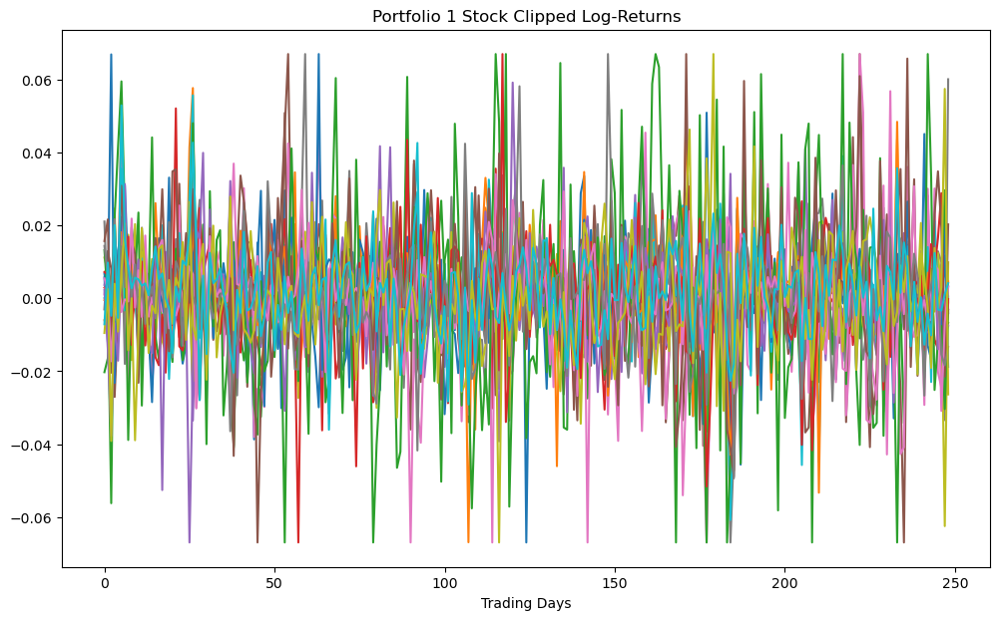

In [100]:
logreturns = np.array(np.log1p(combined_df.pct_change()).iloc[1:])
clipped_logreturns = np.maximum(logreturns, -4*np.std(logreturns))
clipped_logreturns = np.minimum(clipped_logreturns, 4*np.nanstd(logreturns))

plt.figure(figsize=(12, 7))
plt.plot(clipped_logreturns)
plt.xlabel('Trading Days')
_ = plt.title('Portfolio 1 Stock Clipped Log-Returns')

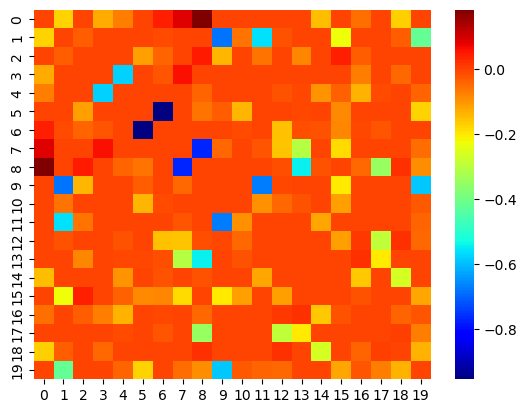

In [107]:
from sklearn.covariance import GraphicalLassoCV

X = np.array(clipped_logreturns)
p = X.shape[1]
X = (X - np.mean(X, axis=0)) / np.std(X, axis=0)

glasso_cv = GraphicalLassoCV().fit(X)

Omegahat = np.around(glasso_cv.precision_, decimals=5)

for j in np.arange(p):
    Omegahat[j, j] = 0

sns.heatmap(Omegahat, cmap='jet')
plt.show()

In [108]:
print(glasso_cv.alpha_)

0.060438240619131285


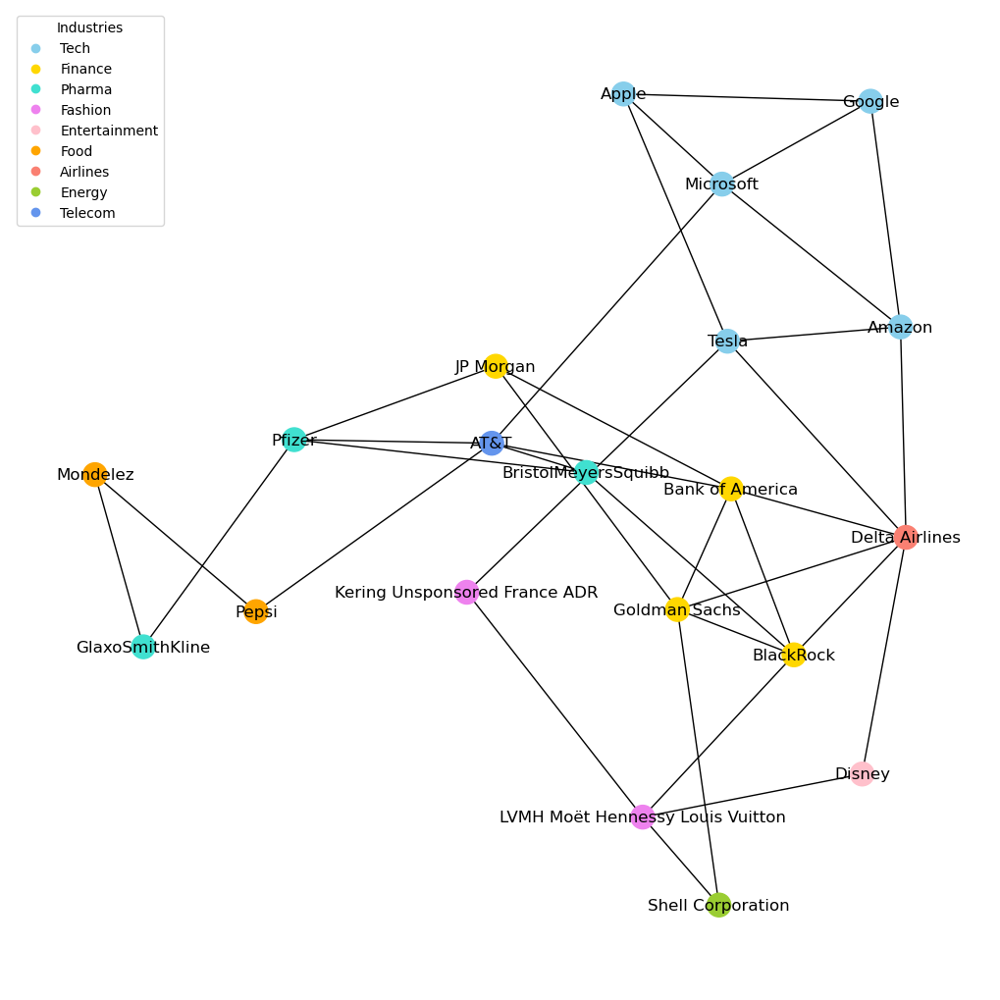

In [113]:
import networkx as nx

np.random.seed(2)

tickers_by_company_name = {
    'AAPL': 'Apple',
    'GOOG': 'Google',
    'MSFT': 'Microsoft',
    'AMZN': 'Amazon',
    'TSLA': 'Tesla',
    'BLK': 'BlackRock',
    'GS': 'Goldman Sachs',
    'JPM': 'JP Morgan',
    'BAC': 'Bank of America',
    'GSK': 'GlaxoSmithKline',
    'BMY': 'BristolMeyersSquibb',
    'PFE': 'Pfizer',
    'LVMUY': 'LVMH Moët Hennessy Louis Vuitton',
    'PPRUY': 'Kering Unsponsored France ADR',
    'DIS': 'Disney',
    'MDLZ': 'Mondelez',
    'PEP': 'Pepsi',
    'DAL': 'Delta Airlines',
    'SHEL': 'Shell Corporation',
    'T': 'AT&T'
}

tickers_by_industry = {
    'AAPL': 'Tech',
    'GOOG': 'Tech',
    'MSFT': 'Tech',
    'AMZN': 'Tech',
    'TSLA': 'Tech',
    'BLK': 'Finance',
    'GS': 'Finance',
    'JPM': 'Finance',
    'BAC': 'Finance',
    'GSK': 'Pharma',
    'BMY': 'Pharma',
    'PFE': 'Pharma',
    'LVMUY': 'Fashion',
    'PPRUY': 'Fashion',
    'DIS': 'Entertainment',
    'MDLZ': 'Food',
    'PEP': 'Food',
    'DAL': 'Airlines',
    'SHEL': 'Energy',
    'T': 'Telecom'
}

industry_colors = {
    'Tech': 'skyblue',
    'Finance': 'gold',
    'Pharma': 'turquoise',
    'Fashion': 'violet',
    'Entertainment': 'pink',
    'Food': 'orange',
    'Airlines': 'salmon',
    'Energy': 'yellowgreen',
    'Telecom': 'cornflowerblue'
}

stocks = [tickers_by_company_name[c] for c in dflogreturn.columns]
precdf = pd.DataFrame(Omegahat, columns=stocks, index=stocks)
links = precdf.stack().reset_index()
links.columns = ['var1', 'var2','value']
links=links.loc[(abs(links['value']) > 0.1) &  (links['var1'] != links['var2']) ]

ticker_to_color = {ticker: industry_colors[industry] for ticker, industry in tickers_by_industry.items()}

node_color = [ticker_to_color[ticker] for ticker in dflogreturn.columns]

G = nx.from_pandas_edgelist(links, 'var1', 'var2', create_using=nx.Graph())

company_to_ticker = {v: k for k, v in tickers_by_company_name.items()}

node_color = [ticker_to_color[company_to_ticker[node]] for node in G.nodes()]

pos = nx.spring_layout(G, k=1.7/np.sqrt(len(G.nodes())), iterations=20)
plt.figure(3, figsize=(10, 10))
nx.draw(G, pos=pos, node_color=node_color, with_labels=True)

# legend
legend_handles = [plt.Line2D([0], [0], marker='o', color=color, label=industry, linestyle='None')
                  for industry, color in industry_colors.items()]
plt.legend(handles=legend_handles, title="Industries", loc='best')

plt.show()

**How did you choose the portolio? How did you choose the date range and frequency (daily, weekly, etc.)?**

I simply chose a diverse set of companies across industries and decided to evaluate historical trends across the last year. This was mainly to determine a starting point for any trends I want to examine further in portfolio 2. I chose more stocks across tech, pharma, and finance (areas I am more interested in) but also included sectors like energy, airlines, food, and fashion.

**How did you choose the regularization level? Does the structure of the graph make sense? Is it sensitive to the choice of regularization level? Is this the structure you expected to see when you designed the portfolio? Why or why not?**

To determine the ideal regularization level, I used GlassoCV. The structure of the graph mostly makes sense, as there is some clustering by industry, and is highly sensitive to the choice of regularization. This is largely what I expected (moderate clustering with some overlap across less represented industries) though I found it very interesting that AT&T had so many connections to other industries and seemingly unrelated sectors, such as food. This may lead me to look more closely at the intersections of pharma, tech, telecom, food, and finance companies in portfolio 2.

**What are some of the conditional independence assumptions implied by the graph? Are some parts of the graph more densely connected than others? Why?**

We see some conditional independence between many companies, especially the five tech companies with respect to everything else, however the clusters in the graph are not perfectly separate. This is likely partially influenced by the fact that there was such diverse representation of industries with non-equal proportions. Furthermore, higher connectivity around JP Morgan, Goldman Sachs, and Bank of America likely represents financial institutions or stocks that have strong interrelationships due to their shared sector or economic influence. 

Pepsi, GlaxoSmithKline, and Mondelez have fewer connections compared to the financial or tech clusters, which suggests that these companies or sectors are less interdependent or influenced by fewer common factors.

### <span style="color:BlueViolet">**Portfolio 2**</span>

In [117]:
# Social Media: META, SNAP, PINS, SPOT, DJT
# Finance: BLK, WFC, MS, UBS, C
# Telecom: AT&T, VZ, TMUS, USM, CHTR
# Pharma: GSK, BMY, PFE, MRK, JNJ

file_paths = glob.glob("/Users/ananya_krishna/Downloads/portfolio2/*.csv")

dataframes = {}

for file in file_paths:
    
    stock_symbol = file.split('/')[-1].split('.')[0]
    df = pd.read_csv(file)
    
    if 'Close/Last' in df.columns:
        
        df.rename(columns={'Close/Last': stock_symbol}, inplace=True)
        df['Date'] = pd.to_datetime(df['Date'])
        df.set_index('Date', inplace=True)

        dataframes[stock_symbol] = df[[stock_symbol]]


combined_df = pd.concat(dataframes.values(), axis=1)

combined_df.sort_index(inplace=True)

combined_df = combined_df.drop(combined_df.index[0])

print(combined_df)

               CHTR       C       T      MRK     UBS    SNAP     DJT     USM  \
Date                                                                           
2023-11-06  $415.70  $42.04  $15.75  $104.34  $24.35  $10.73  $15.07  $42.71   
2023-11-07  $412.98  $41.96  $15.84  $104.00  $24.92  $10.96  $15.45  $42.55   
2023-11-08  $413.48  $41.82  $15.65  $104.40  $24.78  $11.23  $15.38  $42.94   
2023-11-09  $404.46  $41.50  $15.63  $102.38  $24.51  $11.24  $15.13  $41.72   
2023-11-10  $409.81  $42.08  $15.64  $101.39  $24.54  $11.32  $15.14  $41.54   
...             ...     ...     ...      ...     ...     ...     ...     ...   
2024-10-28  $329.67  $64.16  $22.11  $104.23  $32.39  $10.71  $47.36  $62.07   
2024-10-29  $327.27  $64.69  $22.18  $103.73  $32.82  $10.89  $51.51  $61.80   
2024-10-30  $331.30  $64.50  $22.02  $104.83  $31.35  $12.62  $40.03  $62.31   
2024-10-31  $327.61  $64.17  $22.54  $102.32  $30.68  $12.16  $35.34  $61.70   
2024-11-01  $366.49  $63.71  $22.12  $10

In [118]:
combined_df = combined_df.apply(lambda col: pd.to_numeric(col.replace('[\$,]', '', regex=True), errors='coerce'))

dflogreturn = np.log1p(combined_df.pct_change()).iloc[1:]
dflogreturn

,CHTR,C,T,MRK,UBS,SNAP,DJT,USM,PINS,WFC,META,PFE,VZ,SPOT,MS,GSK,TMUS,BMY,JNJ,BLK
Date,,,,,,,,,,,,,,,,,,,,
2023-11-07,-0.006565,-0.001905,0.005698,-0.003264,0.023139,0.021209,0.024903,-0.003753,0.000970,-0.007283,0.009518,0.002243,0.008382,-0.010459,-0.005415,0.005446,-0.001426,-0.009517,-0.005288,-0.007113
2023-11-08,0.001210,-0.003342,-0.012067,0.003839,-0.005634,0.024336,-0.004541,0.009124,0.013479,-0.001463,0.003007,-0.013856,-0.004741,0.026651,0.006073,0.002284,-0.003336,0.002483,-0.003651,0.009758
2023-11-09,-0.022056,-0.007681,-0.001279,-0.019538,-0.010956,0.000890,-0.016388,-0.028823,-0.003513,-0.014254,0.002405,-0.037690,-0.004202,0.001822,-0.023709,-0.017262,0.001703,-0.039099,-0.019680,-0.004790
2023-11-10,0.013141,0.013879,0.000640,-0.009717,0.001223,0.007092,0.000661,-0.004324,-0.006097,0.012056,0.025320,-0.006761,0.002523,0.004102,0.015249,-0.001452,0.004890,0.003960,-0.001154,0.020019
2023-11-13,-0.008331,0.014626,-0.003844,0.010596,-0.017678,-0.001768,0.002639,-0.009919,0.013427,-0.002939,0.001277,-0.017106,0.003076,0.001111,-0.003857,0.005795,-0.002714,-0.009131,0.002577,-0.005353
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-28,-0.019019,0.038124,0.012745,0.002401,0.008994,0.024576,0.195499,0.003874,-0.002786,0.016598,0.008529,0.014308,0.005783,0.013621,0.019068,0.009549,0.006385,0.013772,0.004465,0.012396
2024-10-29,-0.007307,0.008227,0.003161,-0.004809,0.013188,0.016667,0.083998,-0.004359,0.005256,-0.004736,0.025816,-0.013957,-0.006992,0.017716,0.001426,0.007627,-0.007756,-0.002663,-0.009388,-0.003097
2024-10-30,0.012239,-0.002941,-0.007240,0.010549,-0.045824,0.147438,-0.252147,0.008219,0.004922,0.001683,-0.002498,0.002106,-0.001211,0.007106,-0.011635,-0.030862,-0.014616,0.003043,0.003243,-0.003362


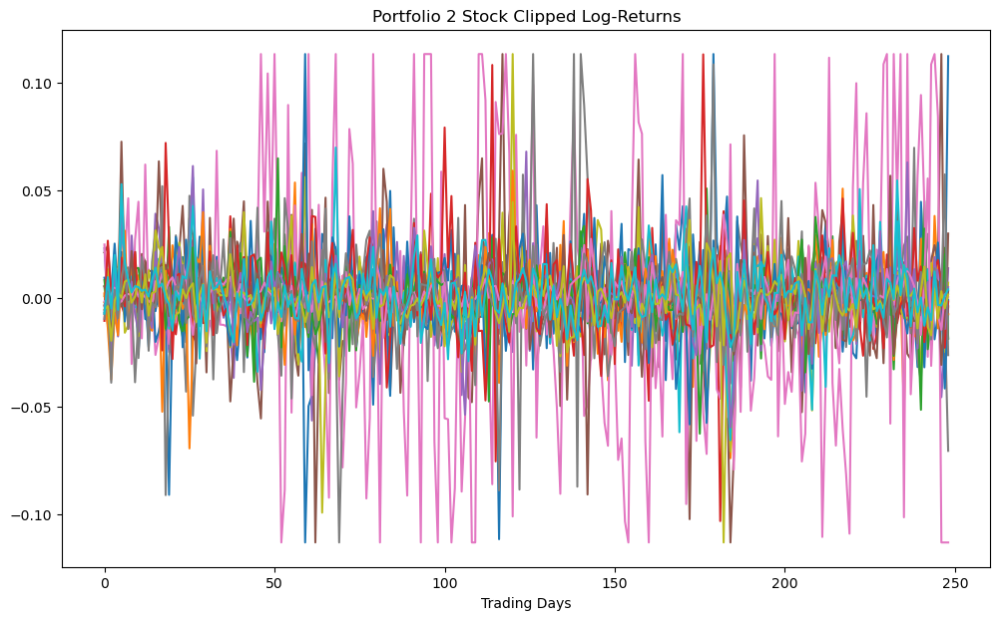

In [119]:
logreturns = np.array(np.log1p(combined_df.pct_change()).iloc[1:])
clipped_logreturns = np.maximum(logreturns, -4*np.std(logreturns))
clipped_logreturns = np.minimum(clipped_logreturns, 4*np.nanstd(logreturns))

plt.figure(figsize=(12, 7))
plt.plot(clipped_logreturns)
plt.xlabel('Trading Days')
_ = plt.title('Portfolio 2 Stock Clipped Log-Returns')

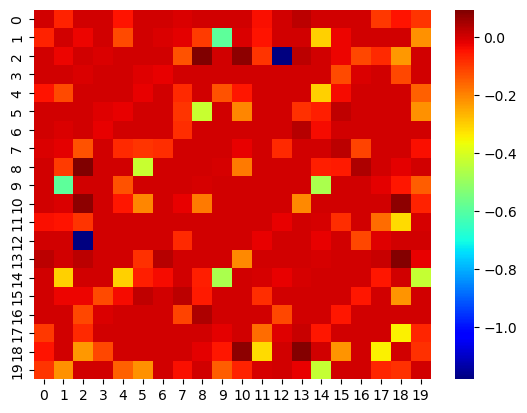

In [120]:
from sklearn.covariance import GraphicalLassoCV

X = np.array(clipped_logreturns)
p = X.shape[1]
X = (X - np.mean(X, axis=0)) / np.std(X, axis=0)

glasso_cv = GraphicalLassoCV().fit(X)

Omegahat = np.around(glasso_cv.precision_, decimals=5)

for j in np.arange(p):
    Omegahat[j, j] = 0

sns.heatmap(Omegahat, cmap='jet')
plt.show()

In [121]:
print(glasso_cv.alpha_)

0.06900379921341468


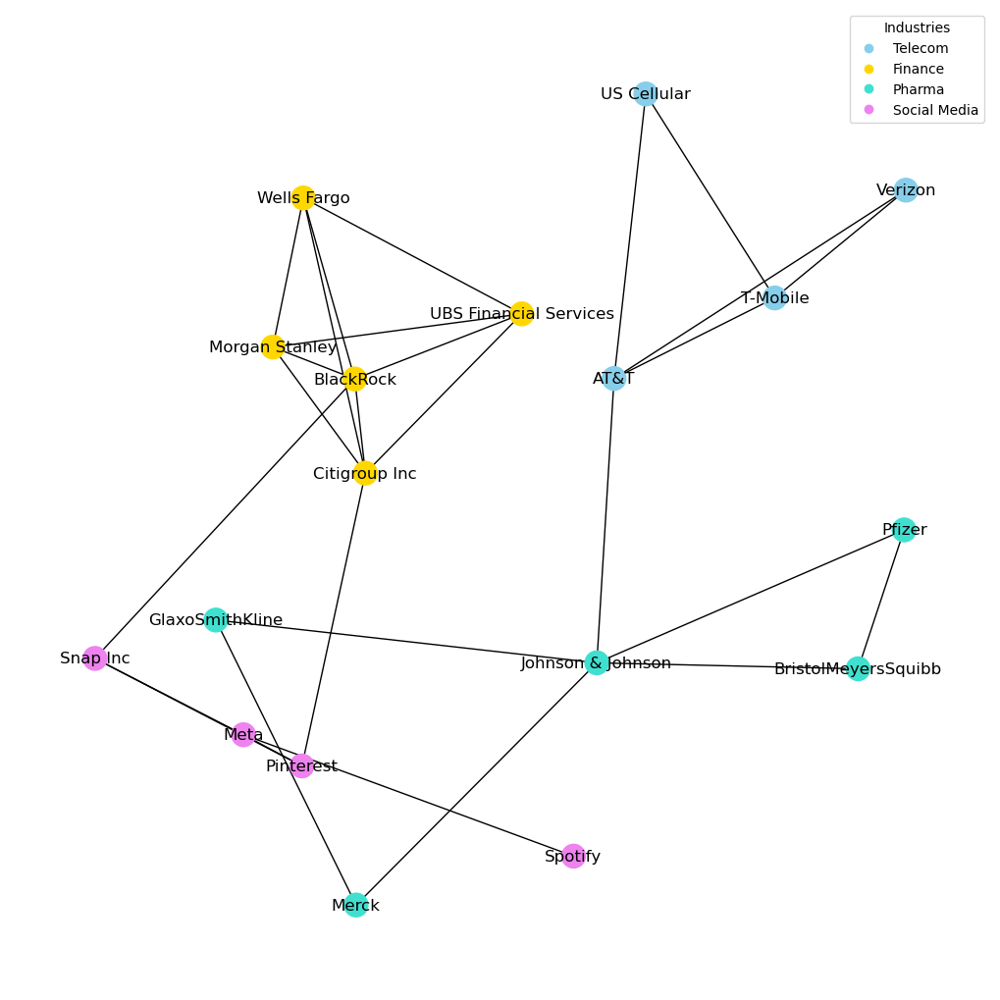

In [122]:
np.random.seed(2)

# Social Media: META, SNAP, PINS, SPOT, DJT
# Finance: BLK, WFC, MS, UBS, C
# Telecom: AT&T, VZ, TMUS, USM, CHTR
# Pharma: GSK, BMY, PFE, MRK, JNJ

tickers_by_company_name = {
    'SNAP': 'Snap Inc',
    'SPOT': 'Spotify',
    'DJT': 'Trump Media & Technology',
    'META': 'Meta',
    'PINS': 'Pinterest',
    'BLK': 'BlackRock',
    'WFC': 'Wells Fargo',
    'MS': 'Morgan Stanley',
    'UBS': 'UBS Financial Services',
    'C': 'Citigroup Inc',
    'BMY': 'BristolMeyersSquibb',
    'PFE': 'Pfizer',
    'MRK': 'Merck',
    'GSK': 'GlaxoSmithKline',
    'JNJ': 'Johnson & Johnson',
    'VZ': 'Verizon',
    'TMUS': 'T-Mobile',
    'USM': 'US Cellular',
    'CHTR': 'Charter Spectrum',
    'T': 'AT&T'
}

tickers_by_industry = {
    'SNAP': 'Social Media',
    'SPOT': 'Social Media',
    'DJT': 'Social Media',
    'META': 'Social Media',
    'PINS': 'Social Media',
    'BLK': 'Finance',
    'WFC': 'Finance',
    'MS': 'Finance',
    'UBS': 'Finance',
    'C': 'Finance',
    'BMY': 'Pharma',
    'PFE': 'Pharma',
    'MRK': 'Pharma',
    'GSK': 'Pharma',
    'JNJ': 'Pharma',
    'VZ': 'Telecom',
    'TMUS': 'Telecom',
    'USM': 'Telecom',
    'CHTR': 'Telecom',
    'T': 'Telecom'
}

industry_colors = {
    'Telecom': 'skyblue',
    'Finance': 'gold',
    'Pharma': 'turquoise',
    'Social Media': 'violet',
}

stocks = [tickers_by_company_name[c] for c in dflogreturn.columns]
precdf = pd.DataFrame(Omegahat, columns=stocks, index=stocks)
links = precdf.stack().reset_index()
links.columns = ['var1', 'var2','value']
links=links.loc[(abs(links['value']) > 0.1) &  (links['var1'] != links['var2']) ]

ticker_to_color = {ticker: industry_colors[industry] for ticker, industry in tickers_by_industry.items()}

node_color = [ticker_to_color[ticker] for ticker in dflogreturn.columns]

G = nx.from_pandas_edgelist(links, 'var1', 'var2', create_using=nx.Graph())

company_to_ticker = {v: k for k, v in tickers_by_company_name.items()}

node_color = [ticker_to_color[company_to_ticker[node]] for node in G.nodes()]

pos = nx.spring_layout(G, k=1.7/np.sqrt(len(G.nodes())), iterations=20)
plt.figure(3, figsize=(10, 10))
nx.draw(G, pos=pos, node_color=node_color, with_labels=True)

# legend
legend_handles = [plt.Line2D([0], [0], marker='o', color=color, label=industry, linestyle='None')
                  for industry, color in industry_colors.items()]
plt.legend(handles=legend_handles, title="Industries", loc='best')

plt.show()

**How did you choose the portolio? How did you choose the date range and frequency (daily, weekly, etc.)?**
Expanding on the trends from portfolio 1, I chose more telecom companies to see if they had diverse connections like AT&T did. I also kept the highly connected finance industry but chose different companies. Finally, I added social media companies to see if these would have an impact on the telecom companies. I again chose the date range to be the past year for ease of viewing.

**How did you choose the regularization level? Does the structure of the graph make sense? Is it sensitive to the choice of regularization level? Is this the structure you expected to see when you designed the portfolio? Why or why not?**

To determine the ideal regularization level, I used GlassoCV. The structure of the graph makes sense, as there is a lot of clustering by industry, and it is also highly sensitive to the choice of regularization. This clustering is what I expected though I expected more connectivity with BlackRock given its massive shareholdings. I was also surprised to see that only two finance companies were connected to companies outside of their cluster, with only one social media company for each. I was also surprised that AT&T was connected to J&J.

**What are some of the conditional independence assumptions implied by the graph? Are some parts of the graph more densely connected than others? Why?**

We see much more conditional independence in portfolio 2 than portfolio 1. There is hardly any overlap across clusters. The graph visually indicates that financial stocks tend to have more dense interconnections, showcasing stronger dependencies within the same sector. Pharma and telecommunications are somewhat interconnected but less so compared to finance, showing moderate conditional dependencies. Social media stocks have some connections outside their cluster, but fewer connectiosn to one another.